# Telecom Churn Case Study

### Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
For many incumbent operators, retaining high profitable customers is the number one business goal.

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

We need to analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

### Understanding and Defining Churn

There are two main models of payment in the telecom industry - <b>postpaid</b> (customers pay a monthly/annual bill after using the services) and <b>prepaid</b>(customers pay/recharge with a certain amount in advance and then use the services).

In the postpaid model, when customers want to switch to another operator, they usually inform the existing operator to terminate the services, and you directly know that this is an instance of churn.

However, in the prepaid model, customers who want to switch to another network can simply stop using the services without any notice, and it is hard to know whether someone has actually churned or is simply not using the services temporarily (e.g. someone may be on a trip abroad for a month or two and then intend to resume using the services again).

Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully.  Also, prepaid is the most common model in India and southeast Asia, while postpaid is more common in Europe in North America.

This project is based on the Indian and Southeast Asian market.


### Definitions of Churn

This project is based on the usage-based churn which is defined as below :

<b>Usage-based churn</b>: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.


### High-value Churn

In the Indian and the southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

In this project, high-value customers based on a below definition : 

Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

<b>Note : It is required to predict churn only on high-value customers.</b>

# How we proceeded with the Case : A brief

As usual, we started the case with basic inspection of the data and found most of the data was related to the functions performed by a telecom customer.
Majority data was numeric and was related to calls or recharges by the customer over the months of Jun-14, Jul-14, Aug-14 and Sep-14.
Some dates were also present in the data. After initial inspection of the data, each and every variable data set for the months was taken and new set of variables were prepared from this.
The data for the months of Jun-14 and Jul-14 was either added or mean or max (based on data) was taken into a new variable that represent `good_phase` (along with data cleaning).
The data for the moths of Aug-14 and Sep-14 was moved to new variables `action_phase` and `churn_phase` respectively (along with data cleaning).
The original data variable columns were then dropped from the data set.

The new data set so obtained from the above process was taken to evaluate the high value customers based on the <b>seventyth percentile of average recharge amount</b>.
High value customers were filtered  out to a different data set and churn values were evaluated for all these customers.
This data for high value customers was used by all the models and each model created its own copies as per its requirement.
The variable columns related to churn phase were dropped from this data set. 
The EDA was carried out on these variables before using them into models.

### Model Building

We proceeded with building up of multiple models starting from basic model to complex Random Forest.
Following is the brief summary of the models we prepared.
	
- Basic Logistic Regression Model using GLM.
- Logistic Regression Model with RFE.
- Logistic Regression Model with L1/L2 Regularization.
- Logistic Regression Model with PCA.
- Decision Tree Model.
- Random Forest Model.

Among these the best model was chosen based on the results.

<b> Note :</b> We believed that the main focus the model is to understand in advance the customers who are expected to churn and model is anticipatd not to miss any potential churn customer.
As such we have chosen <b>Recall</b> or <b>senstivity</b> as the determining factor and across all models we have evaluated the same for comparision.

In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


In [2]:
## reading the data
telecom = pd.read_csv("telecom_churn_data.csv")
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [3]:
## inspecting by shape
telecom.shape

(99999, 226)

In [4]:
## inspecting data variables
telecom.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [5]:
## inspecting by checking the info to get data types and non null counts
telecom.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               99999 non-null int64
circle_id                   99999 non-null int64
loc_og_t2o_mou              98981 non-null float64
std_og_t2o_mou              98981 non-null float64
loc_ic_t2o_mou              98981 non-null float64
last_date_of_month_6        99999 non-null object
last_date_of_month_7        99398 non-null object
last_date_of_month_8        98899 non-null object
last_date_of_month_9        98340 non-null object
arpu_6                      99999 non-null float64
arpu_7                      99999 non-null float64
arpu_8                      99999 non-null float64
arpu_9                      99999 non-null float64
onnet_mou_6                 96062 non-null float64
onnet_mou_7                 96140 non-null float64
onnet_mou_8                 94621 non-null float64
onnet_mou_9                 92254 non-null float64
offnet_mou_6                960

In [6]:
## check unique netries across variables
telecom.apply(pd.Series.nunique)

mobile_number           99999
circle_id                   1
loc_og_t2o_mou              1
std_og_t2o_mou              1
loc_ic_t2o_mou              1
last_date_of_month_6        1
last_date_of_month_7        1
last_date_of_month_8        1
last_date_of_month_9        1
arpu_6                  85681
arpu_7                  85308
arpu_8                  83615
arpu_9                  79937
onnet_mou_6             24313
onnet_mou_7             24336
onnet_mou_8             24089
onnet_mou_9             23565
offnet_mou_6            31140
offnet_mou_7            31023
offnet_mou_8            30908
offnet_mou_9            30077
roam_ic_mou_6            6512
roam_ic_mou_7            5230
roam_ic_mou_8            5315
roam_ic_mou_9            4827
roam_og_mou_6            8038
roam_og_mou_7            6639
roam_og_mou_8            6504
roam_og_mou_9            5882
loc_og_t2t_mou_6        13539
                        ...  
arpu_2g_9                6795
night_pck_user_6            2
night_pck_

In [7]:
## describing numberic variables and checking variance among them
telecom.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [8]:
## checking percentage of nulls across each variable columns
print(round(100*(telecom.isnull().sum())/len(telecom.index), 2))

mobile_number            0.00
circle_id                0.00
loc_og_t2o_mou           1.02
std_og_t2o_mou           1.02
loc_ic_t2o_mou           1.02
last_date_of_month_6     0.00
last_date_of_month_7     0.60
last_date_of_month_8     1.10
last_date_of_month_9     1.66
arpu_6                   0.00
arpu_7                   0.00
arpu_8                   0.00
arpu_9                   0.00
onnet_mou_6              3.94
onnet_mou_7              3.86
onnet_mou_8              5.38
onnet_mou_9              7.75
offnet_mou_6             3.94
offnet_mou_7             3.86
offnet_mou_8             5.38
offnet_mou_9             7.75
roam_ic_mou_6            3.94
roam_ic_mou_7            3.86
roam_ic_mou_8            5.38
roam_ic_mou_9            7.75
roam_og_mou_6            3.94
roam_og_mou_7            3.86
roam_og_mou_8            5.38
roam_og_mou_9            7.75
loc_og_t2t_mou_6         3.94
                        ...  
arpu_2g_9               74.08
night_pck_user_6        74.85
night_pck_

In [9]:
## dropping the variables with no variance i.e. all non null entries have same values
telecom = telecom.loc[:,telecom.apply(pd.Series.nunique) != 1]
telecom.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [10]:
## checking nulls across different columns and getting coulnt in descending order
telecom_nulls = pd.DataFrame(telecom.isnull().sum()).reset_index()
telecom_nulls.columns =['features','null_count']
telecom_nulls =telecom_nulls.sort_values(by='null_count',ascending=False)
telecom_nulls.loc[telecom_nulls['null_count']!=0]

,features,null_count
149,max_rech_data_6,74846
201,fb_user_6,74846
157,count_rech_3g_6,74846
153,count_rech_2g_6,74846
181,night_pck_user_6,74846
173,arpu_3g_6,74846
145,total_rech_data_6,74846
161,av_rech_amt_data_6,74846
177,arpu_2g_6,74846
141,date_of_last_rech_data_6,74846


## Data Preparation

As part of data preparation ,we need to combine the data variables for each data variable set for the months of Jun-14 and Jul-14 to a new column `good_phase`. Similarly, the data for the month Aug-14 was trransformed to new column `action_phase`. Also the data for the Sep-14 was transfrmed to `churn_phase`.
To give an example for this data for the columns `arpu_6` and `arpu_7` was combined to give an average value in column `arpu_av_good_phase`, and columns `arpu_8` and `arpu_9` were moved to `arpu_action_phase` and `arpu_churn_phase`.
After this transformation the original variables were drropped.

This was carried out for all the variable set as below.

In [11]:
## transforming data variable set for arpu
telecom['arpu_av_good_phase'] = (telecom.arpu_6+telecom.arpu_7)/2
telecom['arpu_action_phase'] = telecom.arpu_8
telecom['arpu_churn_phase'] = telecom.arpu_9
#dropping original variables
telecom = telecom.drop(['arpu_6','arpu_7','arpu_8','arpu_9'],axis=1)
telecom.head()

,mobile_number,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,...,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,1.0,NaN,968,30.4,0.0,101.20,3.58,206.1005,213.803,21.100
1,7001865778,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,...,1.0,NaN,1006,0.0,0.0,0.00,0.00,194.5605,268.321,86.285
2,7001625959,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,...,NaN,1.0,1103,0.0,0.0,4.17,0.00,178.3740,210.226,290.714
3,7001204172,99.91,54.39,310.98,241.71,123.31,109.01,71.68,113.54,0.0,...,NaN,NaN,2491,0.0,0.0,0.00,0.00,236.2200,508.054,389.500
4,7000142493,50.31,149.44,83.89,58.78,76.96,91.88,124.26,45.81,0.0,...,NaN,NaN,1526,0.0,0.0,0.00,0.00,285.7560,238.174,163.426


In [12]:
## transforming data variable set for onnet_mou

#handling null values
telecom.loc[np.isnan(telecom['onnet_mou_6']), ['onnet_mou_6']] =0
telecom.loc[np.isnan(telecom['onnet_mou_7']), ['onnet_mou_7']] =0
telecom.loc[np.isnan(telecom['onnet_mou_8']), ['onnet_mou_8']] =0
telecom.loc[np.isnan(telecom['onnet_mou_9']), ['onnet_mou_9']] =0

# creating new columns
telecom['onnet_mou_av_good_phase'] = (telecom.onnet_mou_6+telecom.onnet_mou_7)/2
telecom['onnet_mou_action_phase'] = telecom.onnet_mou_8
telecom['onnet_mou_churn_phase'] = telecom.onnet_mou_9

# dropping original variables
telecom = telecom.drop(['onnet_mou_6','onnet_mou_7','onnet_mou_8','onnet_mou_9'],axis=1)
telecom.head()

,mobile_number,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,...,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,30.4,0.0,101.20,3.58,206.1005,213.803,21.100,0.000,0.00,0.00
1,7001865778,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,...,0.0,0.0,0.00,0.00,194.5605,268.321,86.285,51.395,7.68,18.34
2,7001625959,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,...,0.0,0.0,4.17,0.00,178.3740,210.226,290.714,33.390,37.26,74.81
3,7001204172,123.31,109.01,71.68,113.54,0.0,54.86,44.38,0.00,0.0,...,0.0,0.0,0.00,0.00,236.2200,508.054,389.500,77.150,310.98,241.71
4,7000142493,76.96,91.88,124.26,45.81,0.0,0.00,0.00,0.00,0.0,...,0.0,0.0,0.00,0.00,285.7560,238.174,163.426,99.875,83.89,58.78


In [13]:
## transforming data variable set for offnet_mou

#handling null values
telecom.loc[np.isnan(telecom['offnet_mou_6']), ['offnet_mou_6']] =0
telecom.loc[np.isnan(telecom['offnet_mou_7']), ['offnet_mou_7']] =0
telecom.loc[np.isnan(telecom['offnet_mou_8']), ['offnet_mou_8']] =0
telecom.loc[np.isnan(telecom['offnet_mou_9']), ['offnet_mou_9']] =0

# creating new columns
telecom['offnet_mou_av_good_phase'] = (telecom.offnet_mou_6+telecom.offnet_mou_7)/2
telecom['offnet_mou_action_phase'] = telecom.offnet_mou_8
telecom['offnet_mou_churn_phase'] = telecom.offnet_mou_9

#dropping original variables
telecom = telecom.drop(['offnet_mou_6','offnet_mou_7','offnet_mou_8','offnet_mou_9'],axis=1)
telecom.head()

,mobile_number,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,...,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,3.58,206.1005,213.803,21.100,0.000,0.00,0.00,0.00,0.00,0.00
1,7001865778,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,...,0.00,194.5605,268.321,86.285,51.395,7.68,18.34,57.79,304.76,53.76
2,7001625959,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,...,0.00,178.3740,210.226,290.714,33.390,37.26,74.81,181.96,208.36,118.91
3,7001204172,0.0,54.86,44.38,0.00,0.0,28.09,39.04,0.00,73.68,...,0.00,236.2200,508.054,389.500,77.150,310.98,241.71,116.16,71.68,113.54
4,7000142493,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,50.31,...,0.00,285.7560,238.174,163.426,99.875,83.89,58.78,84.42,124.26,45.81


In [14]:
## transforming data variable set for roam_ic_mou

#handling null values
telecom.loc[np.isnan(telecom['roam_ic_mou_6']), ['roam_ic_mou_6']] =0
telecom.loc[np.isnan(telecom['roam_ic_mou_7']), ['roam_ic_mou_7']] =0
telecom.loc[np.isnan(telecom['roam_ic_mou_8']), ['roam_ic_mou_8']] =0
telecom.loc[np.isnan(telecom['roam_ic_mou_9']), ['roam_ic_mou_9']] =0

telecom['roam_ic_mou_av_good_phase'] = (telecom.roam_ic_mou_6+telecom.roam_ic_mou_7)/2
telecom['roam_ic_mou_action_phase'] = telecom.roam_ic_mou_8
telecom['roam_ic_mou_churn_phase'] = telecom.roam_ic_mou_9

#dropping original variables
telecom = telecom.drop(['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_ic_mou_9'],axis=1)
telecom.head()

,mobile_number,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,...,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,21.100,0.000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,7001865778,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,...,86.285,51.395,7.68,18.34,57.79,304.76,53.76,0.00,0.00,0.00
2,7001625959,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,...,290.714,33.390,37.26,74.81,181.96,208.36,118.91,0.00,0.00,38.49
3,7001204172,0.0,28.09,39.04,0.00,73.68,34.81,10.61,15.49,107.43,...,389.500,77.150,310.98,241.71,116.16,71.68,113.54,27.43,44.38,0.00
4,7000142493,0.0,0.00,0.00,0.00,50.31,149.44,83.89,58.78,67.64,...,163.426,99.875,83.89,58.78,84.42,124.26,45.81,0.00,0.00,0.00


In [15]:
## transforming data variable set for roam_og_mou

#handling null values
telecom.loc[np.isnan(telecom['roam_og_mou_6']), ['roam_og_mou_6']] =0
telecom.loc[np.isnan(telecom['roam_og_mou_7']), ['roam_og_mou_7']] =0
telecom.loc[np.isnan(telecom['roam_og_mou_8']), ['roam_og_mou_8']] =0
telecom.loc[np.isnan(telecom['roam_og_mou_9']), ['roam_og_mou_9']] =0

telecom['roam_og_mou_av_good_phase'] = (telecom.roam_og_mou_6+telecom.roam_og_mou_7)/2
telecom['roam_og_mou_action_phase'] = telecom.roam_og_mou_8
telecom['roam_og_mou_churn_phase'] = telecom.roam_og_mou_9

#dropping original variables
telecom = telecom.drop(['roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','roam_og_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,...,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000,0.00,0.00
1,7001865778,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,...,18.34,57.79,304.76,53.76,0.00,0.00,0.00,0.000,0.00,0.00
2,7001625959,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,...,74.81,181.96,208.36,118.91,0.00,0.00,38.49,0.000,0.00,70.94
3,7001204172,73.68,34.81,10.61,15.49,107.43,83.21,22.46,65.46,1.91,...,241.71,116.16,71.68,113.54,27.43,44.38,0.00,14.045,39.04,0.00
4,7000142493,50.31,149.44,83.89,58.78,67.64,91.88,124.26,37.89,0.00,...,58.78,84.42,124.26,45.81,0.00,0.00,0.00,0.000,0.00,0.00


In [16]:
## transforming data variable set for loc_og_t2t_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_og_t2t_mou_6']), ['loc_og_t2t_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_og_t2t_mou_7']), ['loc_og_t2t_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_og_t2t_mou_8']), ['loc_og_t2t_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_og_t2t_mou_9']), ['loc_og_t2t_mou_9']] =0

telecom['loc_og_t2t_mou_av_good_phase'] = (telecom.loc_og_t2t_mou_6+telecom.loc_og_t2t_mou_7)/2
telecom['loc_og_t2t_mou_action_phase'] = telecom.loc_og_t2t_mou_8
telecom['loc_og_t2t_mou_churn_phase'] = telecom.loc_og_t2t_mou_9

#dropping original variables
telecom = telecom.drop(['loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2t_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,...,offnet_mou_churn_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.00,0.00,0.00,0.000,0.00,0.00,0.000,0.00,0.00
1,7001865778,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,...,53.76,0.00,0.00,0.00,0.000,0.00,0.00,49.220,7.68,18.34
2,7001625959,29.34,16.86,38.46,28.16,24.11,21.79,15.61,22.24,0.0,...,118.91,0.00,0.00,38.49,0.000,0.00,70.94,17.965,13.58,14.39
3,7001204172,107.43,83.21,22.46,65.46,1.91,0.65,4.91,2.06,0.0,...,113.54,27.43,44.38,0.00,14.045,39.04,0.00,54.245,10.61,15.49
4,7000142493,67.64,91.88,124.26,37.89,0.00,0.00,0.00,1.93,0.0,...,45.81,0.00,0.00,0.00,0.000,0.00,0.00,99.875,83.89,58.78


In [17]:
## transforming data variable set for loc_og_t2m_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_og_t2m_mou_6']), ['loc_og_t2m_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_og_t2m_mou_7']), ['loc_og_t2m_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_og_t2m_mou_8']), ['loc_og_t2m_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_og_t2m_mou_9']), ['loc_og_t2m_mou_9']] =0

telecom['loc_og_t2m_mou_av_good_phase'] = (telecom.loc_og_t2m_mou_6+telecom.loc_og_t2m_mou_7)/2
telecom['loc_og_t2m_mou_action_phase'] = telecom.loc_og_t2m_mou_8
telecom['loc_og_t2m_mou_churn_phase'] = telecom.loc_og_t2m_mou_9

#dropping original variables
telecom = telecom.drop(['loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2m_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,...,roam_ic_mou_churn_phase,roam_og_mou_av_good_phase,roam_og_mou_action_phase,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,0.00,0.00,0.000,0.00,0.00,0.000,0.00,0.00
1,7001865778,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,...,0.00,0.000,0.00,0.00,49.220,7.68,18.34,43.725,291.86,53.76
2,7001625959,24.11,21.79,15.61,22.24,0.0,135.54,45.76,0.48,60.66,...,38.49,0.000,0.00,70.94,17.965,13.58,14.39,23.100,38.46,28.16
3,7001204172,1.91,0.65,4.91,2.06,0.0,0.00,0.00,0.00,183.03,...,0.00,14.045,39.04,0.00,54.245,10.61,15.49,95.320,22.46,65.46
4,7000142493,0.00,0.00,0.00,1.93,0.0,0.00,0.00,0.00,117.96,...,0.00,0.000,0.00,0.00,99.875,83.89,58.78,79.760,124.26,37.89


In [18]:
## transforming data variable set for loc_og_t2f_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_og_t2f_mou_6']), ['loc_og_t2f_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_og_t2f_mou_7']), ['loc_og_t2f_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_og_t2f_mou_8']), ['loc_og_t2f_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_og_t2f_mou_9']), ['loc_og_t2f_mou_9']] =0

telecom['loc_og_t2f_mou_av_good_phase'] = (telecom.loc_og_t2f_mou_6+telecom.loc_og_t2f_mou_7)/2
telecom['loc_og_t2f_mou_action_phase'] = telecom.loc_og_t2f_mou_8
telecom['loc_og_t2f_mou_churn_phase'] = telecom.loc_og_t2f_mou_9

#dropping original variables
telecom = telecom.drop(['loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2f_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,...,roam_og_mou_churn_phase,loc_og_t2t_mou_av_good_phase,loc_og_t2t_mou_action_phase,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00
1,7001865778,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,...,0.00,49.220,7.68,18.34,43.725,291.86,53.76,0.00,0.00,0.00
2,7001625959,0.0,135.54,45.76,0.48,60.66,67.41,67.66,64.81,4.34,...,70.94,17.965,13.58,14.39,23.100,38.46,28.16,22.95,15.61,22.24
3,7001204172,0.0,0.00,0.00,0.00,183.03,118.68,37.99,83.03,26.23,...,0.00,54.245,10.61,15.49,95.320,22.46,65.46,1.28,4.91,2.06
4,7000142493,0.0,0.00,0.00,0.00,117.96,241.33,208.16,98.61,0.00,...,0.00,99.875,83.89,58.78,79.760,124.26,37.89,0.00,0.00,1.93


In [19]:
## transforming data variable set for loc_og_t2c_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_og_t2c_mou_6']), ['loc_og_t2c_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_og_t2c_mou_7']), ['loc_og_t2c_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_og_t2c_mou_8']), ['loc_og_t2c_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_og_t2c_mou_9']), ['loc_og_t2c_mou_9']] =0

telecom['loc_og_t2c_mou_av_good_phase'] = (telecom.loc_og_t2c_mou_6+telecom.loc_og_t2c_mou_7)/2
telecom['loc_og_t2c_mou_action_phase'] = telecom.loc_og_t2c_mou_8
telecom['loc_og_t2c_mou_churn_phase'] = telecom.loc_og_t2c_mou_9

#dropping original variables
telecom = telecom.drop(['loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_t2c_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,...,loc_og_t2t_mou_churn_phase,loc_og_t2m_mou_av_good_phase,loc_og_t2m_mou_action_phase,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,0.00,0.00,0.00,0.00,0.00,0.000,0.00,0.00
1,7001865778,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,...,18.34,43.725,291.86,53.76,0.00,0.00,0.00,1.455,0.00,0.00
2,7001625959,60.66,67.41,67.66,64.81,4.34,26.49,22.58,8.76,41.81,...,14.39,23.100,38.46,28.16,22.95,15.61,22.24,67.770,45.76,0.48
3,7001204172,183.03,118.68,37.99,83.03,26.23,14.89,289.58,226.21,2.99,...,15.49,95.320,22.46,65.46,1.28,4.91,2.06,0.000,0.00,0.00
4,7000142493,117.96,241.33,208.16,98.61,0.00,0.00,0.00,0.00,9.31,...,58.78,79.760,124.26,37.89,0.00,0.00,1.93,0.000,0.00,0.00


In [20]:
## transforming data variable set for loc_og_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_og_mou_6']), ['loc_og_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_og_mou_7']), ['loc_og_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_og_mou_8']), ['loc_og_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_og_mou_9']), ['loc_og_mou_9']] =0

telecom['loc_og_mou_av_good_phase'] = (telecom.loc_og_mou_6+telecom.loc_og_mou_7)/2
telecom['loc_og_mou_action_phase'] = telecom.loc_og_mou_8
telecom['loc_og_mou_churn_phase'] = telecom.loc_og_mou_9

telecom = telecom.drop(['loc_og_mou_6','loc_og_mou_7','loc_og_mou_8','loc_og_mou_9'],axis=1)
telecom.head()

,mobile_number,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,...,loc_og_t2m_mou_churn_phase,loc_og_t2f_mou_av_good_phase,loc_og_t2f_mou_action_phase,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.00,0.00,0.00,0.000,0.00,0.00,0.000,0.00,0.00
1,7001865778,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,...,53.76,0.00,0.00,0.00,1.455,0.00,0.00,92.950,299.54,72.11
2,7001625959,4.34,26.49,22.58,8.76,41.81,67.41,75.53,9.28,1.48,...,28.16,22.95,15.61,22.24,67.770,45.76,0.48,64.035,67.66,64.81
3,7001204172,26.23,14.89,289.58,226.21,2.99,1.73,6.53,9.99,0.00,...,65.46,1.28,4.91,2.06,0.000,0.00,0.00,150.855,37.99,83.03
4,7000142493,0.00,0.00,0.00,0.00,9.31,0.00,0.00,0.00,0.00,...,37.89,0.00,0.00,1.93,0.000,0.00,0.00,179.645,208.16,98.61


In [21]:
## transforming data variable set for std_og_t2t_mou

#handling null values
telecom.loc[np.isnan(telecom['std_og_t2t_mou_6']), ['std_og_t2t_mou_6']] =0
telecom.loc[np.isnan(telecom['std_og_t2t_mou_7']), ['std_og_t2t_mou_7']] =0
telecom.loc[np.isnan(telecom['std_og_t2t_mou_8']), ['std_og_t2t_mou_8']] =0
telecom.loc[np.isnan(telecom['std_og_t2t_mou_9']), ['std_og_t2t_mou_9']] =0

telecom['std_og_t2t_mou_av_good_phase'] = (telecom.std_og_t2t_mou_6+telecom.std_og_t2t_mou_7)/2
telecom['std_og_t2t_mou_action_phase'] = telecom.std_og_t2t_mou_8
telecom['std_og_t2t_mou_churn_phase'] = telecom.std_og_t2t_mou_9

telecom = telecom.drop(['std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2t_mou_9'],axis=1)
telecom.head()

,mobile_number,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,...,loc_og_t2f_mou_churn_phase,loc_og_t2c_mou_av_good_phase,loc_og_t2c_mou_action_phase,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,0.00,0.00,0.000,0.00,0.00,0.000,0.00,0.00
1,7001865778,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.23,...,0.00,1.455,0.00,0.00,92.950,299.54,72.11,2.170,0.00,0.00
2,7001625959,41.81,67.41,75.53,9.28,1.48,14.76,22.83,0.0,47.64,...,22.24,67.770,45.76,0.48,64.035,67.66,64.81,15.415,22.58,8.76
3,7001204172,2.99,1.73,6.53,9.99,0.00,0.00,0.00,0.0,29.23,...,2.06,0.000,0.00,0.00,150.855,37.99,83.03,20.560,289.58,226.21
4,7000142493,9.31,0.00,0.00,0.00,0.00,0.00,0.00,0.0,9.31,...,1.93,0.000,0.00,0.00,179.645,208.16,98.61,0.000,0.00,0.00


In [22]:
## transforming data variable set for std_og_t2m_mou

#handling null values
telecom.loc[np.isnan(telecom['std_og_t2m_mou_6']), ['std_og_t2m_mou_6']] =0
telecom.loc[np.isnan(telecom['std_og_t2m_mou_7']), ['std_og_t2m_mou_7']] =0
telecom.loc[np.isnan(telecom['std_og_t2m_mou_8']), ['std_og_t2m_mou_8']] =0
telecom.loc[np.isnan(telecom['std_og_t2m_mou_9']), ['std_og_t2m_mou_9']] =0

telecom['std_og_t2m_mou_av_good_phase'] = (telecom.std_og_t2m_mou_6+telecom.std_og_t2m_mou_7)/2
telecom['std_og_t2m_mou_action_phase'] = telecom.std_og_t2m_mou_8
telecom['std_og_t2m_mou_churn_phase'] = telecom.std_og_t2m_mou_9

#dropping original variables
telecom = telecom.drop(['std_og_t2m_mou_6','std_og_t2m_mou_7','std_og_t2m_mou_8','std_og_t2m_mou_9'],axis=1)
telecom.head()

,mobile_number,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,...,loc_og_t2c_mou_churn_phase,loc_og_mou_av_good_phase,loc_og_mou_action_phase,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,0.00,0.00,0.000,0.00,0.00,0.000,0.00,0.00
1,7001865778,0.00,0.00,0.00,0.0,0.23,4.58,0.13,0.00,0.0,...,0.00,92.950,299.54,72.11,2.170,0.00,0.00,0.230,0.13,0.00
2,7001625959,1.48,14.76,22.83,0.0,47.64,108.68,120.94,18.04,0.0,...,0.48,64.035,67.66,64.81,15.415,22.58,8.76,54.610,75.53,9.28
3,7001204172,0.00,0.00,0.00,0.0,29.23,16.63,296.11,236.21,0.0,...,0.00,150.855,37.99,83.03,20.560,289.58,226.21,2.360,6.53,9.99
4,7000142493,0.00,0.00,0.00,0.0,9.31,0.00,0.00,0.00,0.0,...,0.00,179.645,208.16,98.61,0.000,0.00,0.00,4.655,0.00,0.00


In [23]:
## transforming data variable set for std_og_t2f_mou

#handling null values
telecom.loc[np.isnan(telecom['std_og_t2f_mou_6']), ['std_og_t2f_mou_6']] =0
telecom.loc[np.isnan(telecom['std_og_t2f_mou_7']), ['std_og_t2f_mou_7']] =0
telecom.loc[np.isnan(telecom['std_og_t2f_mou_8']), ['std_og_t2f_mou_8']] =0
telecom.loc[np.isnan(telecom['std_og_t2f_mou_9']), ['std_og_t2f_mou_9']] =0

telecom['std_og_t2f_mou_av_good_phase'] = (telecom.std_og_t2f_mou_6+telecom.std_og_t2f_mou_7)/2
telecom['std_og_t2f_mou_action_phase'] = telecom.std_og_t2f_mou_8
telecom['std_og_t2f_mou_churn_phase'] = telecom.std_og_t2f_mou_9

#dropping original variables
telecom = telecom.drop(['std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','std_og_t2f_mou_9'],axis=1)
telecom.head()

,mobile_number,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,...,loc_og_mou_churn_phase,std_og_t2t_mou_av_good_phase,std_og_t2t_mou_action_phase,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,...,0.00,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.0
1,7001865778,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,...,72.11,2.170,0.00,0.00,0.230,0.13,0.00,0.00,0.00,0.0
2,7001625959,47.64,108.68,120.94,18.04,0.0,0.0,0.0,0.0,46.56,...,64.81,15.415,22.58,8.76,54.610,75.53,9.28,8.12,22.83,0.0
3,7001204172,29.23,16.63,296.11,236.21,0.0,0.0,0.0,0.0,10.96,...,83.03,20.560,289.58,226.21,2.360,6.53,9.99,0.00,0.00,0.0
4,7000142493,9.31,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,...,98.61,0.000,0.00,0.00,4.655,0.00,0.00,0.00,0.00,0.0


In [24]:
## transforming data variable set for std_og_mou

#handling null values
telecom.loc[np.isnan(telecom['std_og_mou_6']), ['std_og_mou_6']] =0
telecom.loc[np.isnan(telecom['std_og_mou_7']), ['std_og_mou_7']] =0
telecom.loc[np.isnan(telecom['std_og_mou_8']), ['std_og_mou_8']] =0
telecom.loc[np.isnan(telecom['std_og_mou_9']), ['std_og_mou_9']] =0

telecom['std_og_mou_av_good_phase'] = (telecom.std_og_mou_6+telecom.std_og_mou_7)/2
telecom['std_og_mou_action_phase'] = telecom.std_og_mou_8
telecom['std_og_mou_churn_phase'] = telecom.std_og_mou_9

#dropping original variables
telecom = telecom.drop(['std_og_mou_6','std_og_mou_7','std_og_mou_8','std_og_mou_9'],axis=1)
telecom.head()

,mobile_number,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,...,std_og_t2t_mou_churn_phase,std_og_t2m_mou_av_good_phase,std_og_t2m_mou_action_phase,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,0.00,0.00,0.00,0.00,0.0,0.000,0.00,0.00
1,7001865778,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,...,0.00,0.230,0.13,0.00,0.00,0.00,0.0,2.405,0.13,0.00
2,7001625959,0.0,0.0,0.0,0.0,46.56,236.84,96.84,42.08,0.45,...,8.76,54.610,75.53,9.28,8.12,22.83,0.0,78.160,120.94,18.04
3,7001204172,0.0,0.0,0.0,0.0,10.96,0.00,18.09,43.29,0.00,...,226.21,2.360,6.53,9.99,0.00,0.00,0.0,22.930,296.11,236.21
4,7000142493,0.0,0.0,0.0,0.0,0.00,0.00,0.00,5.98,0.00,...,0.00,4.655,0.00,0.00,0.00,0.00,0.0,4.655,0.00,0.00


In [25]:
## transforming data variable set for isd_og_mou

#handling null values
telecom.loc[np.isnan(telecom['isd_og_mou_6']), ['isd_og_mou_6']] =0
telecom.loc[np.isnan(telecom['isd_og_mou_7']), ['isd_og_mou_7']] =0
telecom.loc[np.isnan(telecom['isd_og_mou_8']), ['isd_og_mou_8']] =0
telecom.loc[np.isnan(telecom['isd_og_mou_9']), ['isd_og_mou_9']] =0

telecom['isd_og_mou_av_good_phase'] = (telecom.isd_og_mou_6+telecom.isd_og_mou_7)/2
telecom['isd_og_mou_action_phase'] = telecom.isd_og_mou_8
telecom['isd_og_mou_churn_phase'] = telecom.isd_og_mou_9

#dropping original variables
telecom = telecom.drop(['isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','isd_og_mou_9'],axis=1)
telecom.head()

,mobile_number,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,...,std_og_t2m_mou_churn_phase,std_og_t2f_mou_av_good_phase,std_og_t2f_mou_action_phase,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,...,0.00,0.00,0.00,0.0,0.000,0.00,0.00,0.0,0.0,0.0
1,7001865778,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,...,0.00,0.00,0.00,0.0,2.405,0.13,0.00,0.0,0.0,0.0
2,7001625959,46.56,236.84,96.84,42.08,0.45,0.0,0.0,0.0,155.33,...,9.28,8.12,22.83,0.0,78.160,120.94,18.04,0.0,0.0,0.0
3,7001204172,10.96,0.00,18.09,43.29,0.00,0.0,0.0,0.0,223.23,...,9.99,0.00,0.00,0.0,22.930,296.11,236.21,0.0,0.0,0.0
4,7000142493,0.00,0.00,0.00,5.98,0.00,0.0,0.0,0.0,127.28,...,0.00,0.00,0.00,0.0,4.655,0.00,0.00,0.0,0.0,0.0


In [26]:
## transforming data variable set for spl_og_mou

#handling null values
telecom.loc[np.isnan(telecom['spl_og_mou_6']), ['spl_og_mou_6']] =0
telecom.loc[np.isnan(telecom['spl_og_mou_7']), ['spl_og_mou_7']] =0
telecom.loc[np.isnan(telecom['spl_og_mou_8']), ['spl_og_mou_8']] =0
telecom.loc[np.isnan(telecom['spl_og_mou_9']), ['spl_og_mou_9']] =0

telecom['spl_og_mou_av_good_phase'] = (telecom.spl_og_mou_6+telecom.spl_og_mou_7)/2
telecom['spl_og_mou_action_phase'] = telecom.spl_og_mou_8
telecom['spl_og_mou_churn_phase'] = telecom.spl_og_mou_9

#dropping original variables
telecom = telecom.drop(['spl_og_mou_6','spl_og_mou_7','spl_og_mou_8','spl_og_mou_9'],axis=1)
telecom.head()

,mobile_number,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,...,std_og_t2f_mou_churn_phase,std_og_mou_av_good_phase,std_og_mou_action_phase,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,...,0.0,0.000,0.00,0.00,0.0,0.0,0.0,0.000,0.00,0.00
1,7001865778,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,...,0.0,2.405,0.13,0.00,0.0,0.0,0.0,14.055,12.76,0.00
2,7001625959,0.45,0.0,0.0,0.0,155.33,412.94,285.46,124.94,115.69,...,0.0,78.160,120.94,18.04,0.0,0.0,0.0,141.700,96.84,42.08
3,7001204172,0.00,0.0,0.0,0.0,223.23,135.31,352.21,362.54,62.08,...,0.0,22.930,296.11,236.21,0.0,0.0,0.0,5.480,18.09,43.29
4,7000142493,0.00,0.0,0.0,0.0,127.28,241.33,208.16,104.59,105.68,...,0.0,4.655,0.00,0.00,0.0,0.0,0.0,0.000,0.00,5.98


In [27]:
## transforming data variable set for og_others

#handling null values
telecom.loc[np.isnan(telecom['og_others_6']), ['og_others_6']] =0
telecom.loc[np.isnan(telecom['og_others_7']), ['og_others_7']] =0
telecom.loc[np.isnan(telecom['og_others_8']), ['og_others_8']] =0
telecom.loc[np.isnan(telecom['og_others_9']), ['og_others_9']] =0

telecom['og_others_av_good_phase'] = (telecom.og_others_6+telecom.og_others_7)/2
telecom['og_others_action_phase'] = telecom.og_others_8
telecom['og_others_churn_phase'] = telecom.og_others_9

#dropping original variables
telecom = telecom.drop(['og_others_6','og_others_7','og_others_8','og_others_9'],axis=1)
telecom.head()

,mobile_number,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,...,std_og_mou_churn_phase,isd_og_mou_av_good_phase,isd_og_mou_action_phase,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase
0,7000842753,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,...,0.00,0.0,0.0,0.0,0.000,0.00,0.00,0.000,0.0,0.0
1,7001865778,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,...,0.00,0.0,0.0,0.0,14.055,12.76,0.00,0.000,0.0,0.0
2,7001625959,155.33,412.94,285.46,124.94,115.69,71.11,67.46,148.23,14.38,...,18.04,0.0,0.0,0.0,141.700,96.84,42.08,0.225,0.0,0.0
3,7001204172,223.23,135.31,352.21,362.54,62.08,19.98,8.04,41.73,113.96,...,236.21,0.0,0.0,0.0,5.480,18.09,43.29,0.000,0.0,0.0
4,7000142493,127.28,241.33,208.16,104.59,105.68,88.49,233.81,154.56,106.84,...,0.00,0.0,0.0,0.0,0.000,0.00,5.98,0.000,0.0,0.0


In [28]:
## transforming data variable total_og_mou
telecom['total_og_mou_good_phase'] = telecom.total_og_mou_6+telecom.total_og_mou_7
telecom['total_og_mou_action_phase'] = telecom.total_og_mou_8
telecom['total_og_mou_churn_phase'] = telecom.total_og_mou_9

#dropping original variables
telecom = telecom.drop(['total_og_mou_6','total_og_mou_7','total_og_mou_8','total_og_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,...,isd_og_mou_churn_phase,spl_og_mou_av_good_phase,spl_og_mou_action_phase,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase
0,7000842753,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,...,0.0,0.000,0.00,0.00,0.000,0.0,0.0,0.00,0.00,0.00
1,7001865778,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,...,0.0,14.055,12.76,0.00,0.000,0.0,0.0,218.84,312.44,72.11
2,7001625959,115.69,71.11,67.46,148.23,14.38,15.44,38.89,38.98,99.48,...,0.0,141.700,96.84,42.08,0.225,0.0,0.0,568.27,285.46,124.94
3,7001204172,62.08,19.98,8.04,41.73,113.96,64.51,20.28,52.86,57.43,...,0.0,5.480,18.09,43.29,0.000,0.0,0.0,358.54,352.21,362.54
4,7000142493,105.68,88.49,233.81,154.56,106.84,109.54,104.13,48.24,1.50,...,0.0,0.000,0.00,5.98,0.000,0.0,0.0,368.61,208.16,104.59


In [29]:
## transforming data variable set for loc_ic_t2t_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_ic_t2t_mou_6']), ['loc_ic_t2t_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2t_mou_7']), ['loc_ic_t2t_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2t_mou_8']), ['loc_ic_t2t_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2t_mou_9']), ['loc_ic_t2t_mou_9']] =0

telecom['loc_ic_t2t_mou_av_good_phase'] = (telecom.loc_ic_t2t_mou_6+telecom.loc_ic_t2t_mou_7)/2
telecom['loc_ic_t2t_mou_action_phase'] = telecom.loc_ic_t2t_mou_8
telecom['loc_ic_t2t_mou_churn_phase'] = telecom.loc_ic_t2t_mou_9

#dropping original variables
telecom = telecom.drop(['loc_ic_t2t_mou_6','loc_ic_t2t_mou_7','loc_ic_t2t_mou_8','loc_ic_t2t_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,...,spl_og_mou_churn_phase,og_others_av_good_phase,og_others_action_phase,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase
0,7000842753,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,...,0.00,0.000,0.0,0.0,0.00,0.00,0.00,0.000,0.16,0.00
1,7001865778,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,...,0.00,0.000,0.0,0.0,218.84,312.44,72.11,15.760,29.23,116.09
2,7001625959,14.38,15.44,38.89,38.98,99.48,122.29,49.63,158.19,229.56,...,42.08,0.225,0.0,0.0,568.27,285.46,124.94,93.400,67.46,148.23
3,7001204172,113.96,64.51,20.28,52.86,57.43,27.09,19.84,65.59,233.48,...,43.29,0.000,0.0,0.0,358.54,352.21,362.54,41.030,8.04,41.73
4,7000142493,106.84,109.54,104.13,48.24,1.50,0.00,0.00,0.00,214.03,...,5.98,0.000,0.0,0.0,368.61,208.16,104.59,97.085,233.81,154.56


In [30]:
## transforming data variable set for loc_ic_t2m_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_ic_t2m_mou_6']), ['loc_ic_t2m_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2m_mou_7']), ['loc_ic_t2m_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2m_mou_8']), ['loc_ic_t2m_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2m_mou_9']), ['loc_ic_t2m_mou_9']] =0

telecom['loc_ic_t2m_mou_av_good_phase'] = (telecom.loc_ic_t2m_mou_6+telecom.loc_ic_t2m_mou_7)/2
telecom['loc_ic_t2m_mou_action_phase'] = telecom.loc_ic_t2m_mou_8
telecom['loc_ic_t2m_mou_churn_phase'] = telecom.loc_ic_t2m_mou_9

#dropping original variables
telecom = telecom.drop(['loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2m_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,...,og_others_churn_phase,total_og_mou_good_phase,total_og_mou_action_phase,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase
0,7000842753,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,...,0.0,0.00,0.00,0.00,0.000,0.16,0.00,0.000,4.13,0.00
1,7001865778,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,...,0.0,218.84,312.44,72.11,15.760,29.23,116.09,41.430,375.58,56.93
2,7001625959,99.48,122.29,49.63,158.19,229.56,208.86,155.99,345.41,72.41,...,0.0,568.27,285.46,124.94,93.400,67.46,148.23,14.910,38.89,38.98
3,7001204172,57.43,27.09,19.84,65.59,233.48,111.59,48.18,160.19,43.48,...,0.0,358.54,352.21,362.54,41.030,8.04,41.73,89.235,20.28,52.86
4,7000142493,1.50,0.00,0.00,0.00,214.03,198.04,337.94,202.81,0.00,...,0.0,368.61,208.16,104.59,97.085,233.81,154.56,108.190,104.13,48.24


In [31]:
## transforming data variable set for loc_ic_t2f_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_ic_t2f_mou_6']), ['loc_ic_t2f_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2f_mou_7']), ['loc_ic_t2f_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2f_mou_8']), ['loc_ic_t2f_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_ic_t2f_mou_9']), ['loc_ic_t2f_mou_9']] =0

telecom['loc_ic_t2f_mou_av_good_phase'] = (telecom.loc_ic_t2f_mou_6+telecom.loc_ic_t2f_mou_7)/2
telecom['loc_ic_t2f_mou_action_phase'] = telecom.loc_ic_t2f_mou_8
telecom['loc_ic_t2f_mou_churn_phase'] = telecom.loc_ic_t2f_mou_9

#dropping original variables
telecom = telecom.drop(['loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','loc_ic_t2f_mou_9'],axis=1)
telecom.head()

,mobile_number,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,...,total_og_mou_churn_phase,loc_ic_t2t_mou_av_good_phase,loc_ic_t2t_mou_action_phase,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase
0,7000842753,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,0.16,0.00,0.000,4.13,0.00,0.000,1.15,0.00
1,7001865778,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,...,72.11,15.760,29.23,116.09,41.430,375.58,56.93,4.465,3.61,0.00
2,7001625959,229.56,208.86,155.99,345.41,72.41,71.29,28.69,49.44,45.18,...,124.94,93.400,67.46,148.23,14.910,38.89,38.98,110.885,49.63,158.19
3,7001204172,233.48,111.59,48.18,160.19,43.48,66.44,0.00,129.84,1.33,...,362.54,41.030,8.04,41.73,89.235,20.28,52.86,42.260,19.84,65.59
4,7000142493,214.03,198.04,337.94,202.81,0.00,0.00,0.86,2.31,1.93,...,104.59,97.085,233.81,154.56,108.190,104.13,48.24,0.750,0.00,0.00


In [32]:
## transforming data variable set for loc_ic_mou

#handling null values
telecom.loc[np.isnan(telecom['loc_ic_mou_6']), ['loc_ic_mou_6']] =0
telecom.loc[np.isnan(telecom['loc_ic_mou_7']), ['loc_ic_mou_7']] =0
telecom.loc[np.isnan(telecom['loc_ic_mou_8']), ['loc_ic_mou_8']] =0
telecom.loc[np.isnan(telecom['loc_ic_mou_9']), ['loc_ic_mou_9']] =0

telecom['loc_ic_mou_av_good_phase'] = (telecom.loc_ic_mou_6+telecom.loc_ic_mou_7)/2
telecom['loc_ic_mou_action_phase'] = telecom.loc_ic_mou_8
telecom['loc_ic_mou_churn_phase'] = telecom.loc_ic_mou_9

#dropping original variables
telecom = telecom.drop(['loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','loc_ic_mou_9'],axis=1)
telecom.head()

,mobile_number,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,...,loc_ic_t2t_mou_churn_phase,loc_ic_t2m_mou_av_good_phase,loc_ic_t2m_mou_action_phase,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,4.13,0.00,0.000,1.15,0.00,0.000,5.44,0.00
1,7001865778,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,...,116.09,41.430,375.58,56.93,4.465,3.61,0.00,61.660,408.43,173.03
2,7001625959,72.41,71.29,28.69,49.44,45.18,177.01,167.09,118.18,21.73,...,148.23,14.910,38.89,38.98,110.885,49.63,158.19,219.210,155.99,345.41
3,7001204172,43.48,66.44,0.00,129.84,1.33,38.56,4.94,13.98,1.18,...,41.73,89.235,20.28,52.86,42.260,19.84,65.59,172.535,48.18,160.19
4,7000142493,0.00,0.00,0.86,2.31,1.93,0.25,0.00,0.00,0.00,...,154.56,108.190,104.13,48.24,0.750,0.00,0.00,206.035,337.94,202.81


In [33]:
## transforming data variable set for std_ic_t2t_mou

#handling null values
telecom.loc[np.isnan(telecom['std_ic_t2t_mou_6']), ['std_ic_t2t_mou_6']] =0
telecom.loc[np.isnan(telecom['std_ic_t2t_mou_7']), ['std_ic_t2t_mou_7']] =0
telecom.loc[np.isnan(telecom['std_ic_t2t_mou_8']), ['std_ic_t2t_mou_8']] =0
telecom.loc[np.isnan(telecom['std_ic_t2t_mou_9']), ['std_ic_t2t_mou_9']] =0

telecom['std_ic_t2t_mou_av_good_phase'] = (telecom.std_ic_t2t_mou_6+telecom.std_ic_t2t_mou_7)/2
telecom['std_ic_t2t_mou_action_phase'] = telecom.std_ic_t2t_mou_8
telecom['std_ic_t2t_mou_churn_phase'] = telecom.std_ic_t2t_mou_9

#dropping original variables
telecom = telecom.drop(['std_ic_t2t_mou_6','std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2t_mou_9'],axis=1)
telecom.head()

,mobile_number,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,...,loc_ic_t2m_mou_churn_phase,loc_ic_t2f_mou_av_good_phase,loc_ic_t2f_mou_action_phase,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,...,0.00,0.000,1.15,0.00,0.000,5.44,0.00,0.00,0.00,0.00
1,7001865778,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,5.90,...,56.93,4.465,3.61,0.00,61.660,408.43,173.03,0.00,2.35,0.00
2,7001625959,45.18,177.01,167.09,118.18,21.73,58.34,43.23,3.86,139.33,...,38.98,110.885,49.63,158.19,219.210,155.99,345.41,71.85,28.69,49.44
3,7001204172,1.33,38.56,4.94,13.98,1.18,0.00,0.00,0.00,45.99,...,52.86,42.260,19.84,65.59,172.535,48.18,160.19,54.96,0.00,129.84
4,7000142493,1.93,0.25,0.00,0.00,0.00,0.00,0.00,0.00,1.93,...,48.24,0.750,0.00,0.00,206.035,337.94,202.81,0.00,0.86,2.31


In [34]:
## transforming data variable set for std_ic_t2m_mou

#handling null values
telecom.loc[np.isnan(telecom['std_ic_t2m_mou_6']), ['std_ic_t2m_mou_6']] =0
telecom.loc[np.isnan(telecom['std_ic_t2m_mou_7']), ['std_ic_t2m_mou_7']] =0
telecom.loc[np.isnan(telecom['std_ic_t2m_mou_8']), ['std_ic_t2m_mou_8']] =0
telecom.loc[np.isnan(telecom['std_ic_t2m_mou_9']), ['std_ic_t2m_mou_9']] =0

telecom['std_ic_t2m_mou_av_good_phase'] = (telecom.std_ic_t2m_mou_6+telecom.std_ic_t2m_mou_7)/2
telecom['std_ic_t2m_mou_action_phase'] = telecom.std_ic_t2m_mou_8
telecom['std_ic_t2m_mou_churn_phase'] = telecom.std_ic_t2m_mou_9

#dropping original variables
telecom = telecom.drop(['std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2m_mou_9'],axis=1)
telecom.head()

,mobile_number,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,...,loc_ic_t2f_mou_churn_phase,loc_ic_mou_av_good_phase,loc_ic_mou_action_phase,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,...,0.00,0.000,5.44,0.00,0.00,0.00,0.00,0.000,0.00,0.00
1,7001865778,0.00,0.00,0.00,0.00,5.90,0.00,14.84,15.01,26.83,...,0.00,61.660,408.43,173.03,0.00,2.35,0.00,2.950,12.49,15.01
2,7001625959,21.73,58.34,43.23,3.86,139.33,306.66,239.03,171.49,370.04,...,158.19,219.210,155.99,345.41,71.85,28.69,49.44,111.095,167.09,118.18
3,7001204172,1.18,0.00,0.00,0.00,45.99,105.01,4.94,143.83,280.08,...,65.59,172.535,48.18,160.19,54.96,0.00,129.84,19.945,4.94,13.98
4,7000142493,0.00,0.00,0.00,0.00,1.93,0.25,0.86,2.31,216.44,...,0.00,206.035,337.94,202.81,0.00,0.86,2.31,1.090,0.00,0.00


In [35]:
## transforming data variable set for std_ic_t2f_mou

#handling null values
telecom.loc[np.isnan(telecom['std_ic_t2f_mou_6']), ['std_ic_t2f_mou_6']] =0
telecom.loc[np.isnan(telecom['std_ic_t2f_mou_7']), ['std_ic_t2f_mou_7']] =0
telecom.loc[np.isnan(telecom['std_ic_t2f_mou_8']), ['std_ic_t2f_mou_8']] =0
telecom.loc[np.isnan(telecom['std_ic_t2f_mou_9']), ['std_ic_t2f_mou_9']] =0

telecom['std_ic_t2f_mou_av_good_phase'] = (telecom.std_ic_t2f_mou_6+telecom.std_ic_t2f_mou_7)/2
telecom['std_ic_t2f_mou_action_phase'] = telecom.std_ic_t2f_mou_8
telecom['std_ic_t2f_mou_churn_phase'] = telecom.std_ic_t2f_mou_9

#dropping original variables
telecom = telecom.drop(['std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8','std_ic_t2f_mou_9'],axis=1)
telecom.head()

,mobile_number,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,...,loc_ic_mou_churn_phase,std_ic_t2t_mou_av_good_phase,std_ic_t2t_mou_action_phase,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase
0,7000842753,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,...,0.00,0.00,0.00,0.00,0.000,0.00,0.00,0.000,0.00,0.00
1,7001865778,5.90,0.00,14.84,15.01,26.83,104.23,423.28,188.04,0.00,...,173.03,0.00,2.35,0.00,2.950,12.49,15.01,0.000,0.00,0.00
2,7001625959,139.33,306.66,239.03,171.49,370.04,519.53,395.03,517.74,0.21,...,345.41,71.85,28.69,49.44,111.095,167.09,118.18,40.035,43.23,3.86
3,7001204172,45.99,105.01,4.94,143.83,280.08,216.61,53.13,305.38,0.59,...,160.19,54.96,0.00,129.84,19.945,4.94,13.98,0.590,0.00,0.00
4,7000142493,1.93,0.25,0.86,2.31,216.44,198.29,338.81,205.31,0.00,...,202.81,0.00,0.86,2.31,1.090,0.00,0.00,0.000,0.00,0.00


In [36]:
## transforming data variable set for std_ic_mou

#handling null values
telecom.loc[np.isnan(telecom['std_ic_mou_6']), ['std_ic_mou_6']] =0
telecom.loc[np.isnan(telecom['std_ic_mou_7']), ['std_ic_mou_7']] =0
telecom.loc[np.isnan(telecom['std_ic_mou_8']), ['std_ic_mou_8']] =0
telecom.loc[np.isnan(telecom['std_ic_mou_9']), ['std_ic_mou_9']] =0

telecom['std_ic_mou_av_good_phase'] = (telecom.std_ic_mou_6+telecom.std_ic_mou_7)/2
telecom['std_ic_mou_action_phase'] = telecom.std_ic_mou_8
telecom['std_ic_mou_churn_phase'] = telecom.std_ic_mou_9

#dropping original variables
telecom = telecom.drop(['std_ic_mou_6','std_ic_mou_7','std_ic_mou_8','std_ic_mou_9'],axis=1)
telecom.head()

,mobile_number,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,...,std_ic_t2t_mou_churn_phase,std_ic_t2m_mou_av_good_phase,std_ic_t2m_mou_action_phase,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase
0,7000842753,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,...,0.00,0.000,0.00,0.00,0.000,0.00,0.00,0.000,0.00,0.00
1,7001865778,26.83,104.23,423.28,188.04,0.00,0.0,0.0,0.00,1.83,...,0.00,2.950,12.49,15.01,0.000,0.00,0.00,2.950,14.84,15.01
2,7001625959,370.04,519.53,395.03,517.74,0.21,0.0,0.0,0.45,0.00,...,49.44,111.095,167.09,118.18,40.035,43.23,3.86,222.995,239.03,171.49
3,7001204172,280.08,216.61,53.13,305.38,0.59,0.0,0.0,0.55,0.00,...,129.84,19.945,4.94,13.98,0.590,0.00,0.00,75.500,4.94,143.83
4,7000142493,216.44,198.29,338.81,205.31,0.00,0.0,0.0,0.18,0.00,...,2.31,1.090,0.00,0.00,0.000,0.00,0.00,1.090,0.86,2.31


In [37]:
## transforming data variable set for total_ic_mou
telecom['total_ic_mou_av_good_phase'] = telecom.total_ic_mou_6+telecom.total_ic_mou_7
telecom['total_ic_mou_action_phase'] = telecom.total_ic_mou_8
telecom['total_ic_mou_churn_phase'] = telecom.total_ic_mou_9

#dropping original variables
telecom = telecom.drop(['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','total_ic_mou_9'],axis=1)
telecom.head()

,mobile_number,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,...,std_ic_t2m_mou_churn_phase,std_ic_t2f_mou_av_good_phase,std_ic_t2f_mou_action_phase,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,...,0.00,0.000,0.00,0.00,0.000,0.00,0.00,0.00,5.44,0.00
1,7001865778,0.00,0.0,0.0,0.00,1.83,0.00,0.0,0.00,0.00,...,15.01,0.000,0.00,0.00,2.950,14.84,15.01,131.06,423.28,188.04
2,7001625959,0.21,0.0,0.0,0.45,0.00,0.85,0.0,0.01,0.93,...,118.18,40.035,43.23,3.86,222.995,239.03,171.49,889.57,395.03,517.74
3,7001204172,0.59,0.0,0.0,0.55,0.00,0.00,0.0,0.00,0.00,...,13.98,0.590,0.00,0.00,75.500,4.94,143.83,496.69,53.13,305.38
4,7000142493,0.00,0.0,0.0,0.18,0.00,0.00,0.0,0.00,0.48,...,0.00,0.000,0.00,0.00,1.090,0.86,2.31,414.73,338.81,205.31


In [38]:
## transforming data variable set for spl_ic_mou

#handling null values
telecom.loc[np.isnan(telecom['spl_ic_mou_6']), ['spl_ic_mou_6']] =0
telecom.loc[np.isnan(telecom['spl_ic_mou_7']), ['spl_ic_mou_7']] =0
telecom.loc[np.isnan(telecom['spl_ic_mou_8']), ['spl_ic_mou_8']] =0
telecom.loc[np.isnan(telecom['spl_ic_mou_9']), ['spl_ic_mou_9']] =0

telecom['spl_ic_mou_av_good_phase'] = (telecom.spl_ic_mou_6+telecom.spl_ic_mou_7)/2
telecom['spl_ic_mou_action_phase'] = telecom.spl_ic_mou_8
telecom['spl_ic_mou_churn_phase'] = telecom.spl_ic_mou_9

#dropping original variables
telecom = telecom.drop(['spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','spl_ic_mou_9'],axis=1)
telecom.head()

,mobile_number,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,...,std_ic_t2f_mou_churn_phase,std_ic_mou_av_good_phase,std_ic_mou_action_phase,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,...,0.00,0.000,0.00,0.00,0.00,5.44,0.00,0.000,0.0,0.00
1,7001865778,1.83,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,...,0.00,2.950,14.84,15.01,131.06,423.28,188.04,0.000,0.0,0.00
2,7001625959,0.00,0.85,0.0,0.01,0.93,3.14,0.0,0.36,5,...,3.86,222.995,239.03,171.49,889.57,395.03,517.74,0.105,0.0,0.45
3,7001204172,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.80,10,...,0.00,75.500,4.94,143.83,496.69,53.13,305.38,0.295,0.0,0.55
4,7000142493,0.00,0.00,0.0,0.00,0.48,0.00,0.0,0.00,5,...,0.00,1.090,0.86,2.31,414.73,338.81,205.31,0.000,0.0,0.18


In [39]:
## transforming data variable set for isd_ic_mou

#handling null values
telecom.loc[np.isnan(telecom['isd_ic_mou_6']), ['isd_ic_mou_6']] =0
telecom.loc[np.isnan(telecom['isd_ic_mou_7']), ['isd_ic_mou_7']] =0
telecom.loc[np.isnan(telecom['isd_ic_mou_8']), ['isd_ic_mou_8']] =0
telecom.loc[np.isnan(telecom['isd_ic_mou_9']), ['isd_ic_mou_9']] =0

telecom['isd_ic_mou_av_good_phase'] = (telecom.isd_ic_mou_6+telecom.isd_ic_mou_7)/2
telecom['isd_ic_mou_action_phase'] = telecom.isd_ic_mou_8
telecom['isd_ic_mou_churn_phase'] = telecom.isd_ic_mou_9

#dropping original variables
telecom = telecom.drop(['isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','isd_ic_mou_9'],axis=1)
telecom.head()

,mobile_number,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,...,std_ic_mou_churn_phase,total_ic_mou_av_good_phase,total_ic_mou_action_phase,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase
0,7000842753,NaN,NaN,0.0,NaN,4,3,2,6,362,...,0.00,0.00,5.44,0.00,0.000,0.0,0.00,0.000,0.0,0.00
1,7001865778,0.00,0.00,0.0,0.00,4,9,11,5,74,...,15.01,131.06,423.28,188.04,0.000,0.0,0.00,0.915,0.0,0.00
2,7001625959,0.93,3.14,0.0,0.36,5,4,2,7,168,...,171.49,889.57,395.03,517.74,0.105,0.0,0.45,0.425,0.0,0.01
3,7001204172,0.00,0.00,0.0,0.80,10,11,18,14,230,...,143.83,496.69,53.13,305.38,0.295,0.0,0.55,0.000,0.0,0.00
4,7000142493,0.48,0.00,0.0,0.00,5,6,3,4,196,...,2.31,414.73,338.81,205.31,0.000,0.0,0.18,0.000,0.0,0.00


In [40]:
## transforming data variable set for ic_others

#handling null values
telecom.loc[np.isnan(telecom['ic_others_6']), ['ic_others_6']] =0
telecom.loc[np.isnan(telecom['ic_others_7']), ['ic_others_7']] =0
telecom.loc[np.isnan(telecom['ic_others_8']), ['ic_others_8']] =0
telecom.loc[np.isnan(telecom['ic_others_9']), ['ic_others_9']] =0

telecom['ic_others_av_good_phase'] = (telecom.ic_others_6+telecom.ic_others_7)/2
telecom['ic_others_action_phase'] = telecom.ic_others_8
telecom['ic_others_churn_phase'] = telecom.ic_others_9

#dropping original variables
telecom = telecom.drop(['ic_others_6','ic_others_7','ic_others_8','ic_others_9'],axis=1)
telecom.head()

,mobile_number,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,...,total_ic_mou_churn_phase,spl_ic_mou_av_good_phase,spl_ic_mou_action_phase,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase
0,7000842753,4,3,2,6,362,252,252,0,252,...,0.00,0.000,0.0,0.00,0.000,0.0,0.00,0.000,0.0,0.00
1,7001865778,4,9,11,5,74,384,283,121,44,...,188.04,0.000,0.0,0.00,0.915,0.0,0.00,0.000,0.0,0.00
2,7001625959,5,4,2,7,168,315,116,358,86,...,517.74,0.105,0.0,0.45,0.425,0.0,0.01,2.035,0.0,0.36
3,7001204172,10,11,18,14,230,310,601,410,60,...,305.38,0.295,0.0,0.55,0.000,0.0,0.00,0.000,0.0,0.80
4,7000142493,5,6,3,4,196,350,287,200,56,...,205.31,0.000,0.0,0.18,0.000,0.0,0.00,0.240,0.0,0.00


In [41]:
## transforming data variable set for total_rech_num
telecom['total_rech_num_good_phase'] = telecom.total_rech_num_6+telecom.total_rech_num_7
telecom['total_rech_num_action_phase'] = telecom.total_rech_num_8
telecom['total_rech_num_churn_phase'] = telecom.total_rech_num_9

#dropping original variables
telecom = telecom.drop(['total_rech_num_6','total_rech_num_7','total_rech_num_8','total_rech_num_9'],axis=1)
telecom.head()

,mobile_number,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,...,spl_ic_mou_churn_phase,isd_ic_mou_av_good_phase,isd_ic_mou_action_phase,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase
0,7000842753,362,252,252,0,252,252,252,0,6/21/2014,...,0.00,0.000,0.0,0.00,0.000,0.0,0.00,7,2,6
1,7001865778,74,384,283,121,44,154,65,50,6/29/2014,...,0.00,0.915,0.0,0.00,0.000,0.0,0.00,13,11,5
2,7001625959,168,315,116,358,86,200,86,100,6/17/2014,...,0.45,0.425,0.0,0.01,2.035,0.0,0.36,9,2,7
3,7001204172,230,310,601,410,60,50,50,50,6/28/2014,...,0.55,0.000,0.0,0.00,0.000,0.0,0.80,21,18,14
4,7000142493,196,350,287,200,56,110,110,50,6/26/2014,...,0.18,0.000,0.0,0.00,0.240,0.0,0.00,11,3,4


In [42]:
## transforming data variable set for total_rech_amt
telecom['total_rech_amt_good_phase'] = telecom.total_rech_amt_6+telecom.total_rech_amt_7
telecom['total_rech_amt_action_phase'] = telecom.total_rech_amt_8
telecom['total_rech_amt_churn_phase'] = telecom.total_rech_amt_9

#dropping original variables
telecom = telecom.drop(['total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_rech_amt_9'],axis=1)
telecom.head()

,mobile_number,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,...,isd_ic_mou_churn_phase,ic_others_av_good_phase,ic_others_action_phase,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase
0,7000842753,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,...,0.00,0.000,0.0,0.00,7,2,6,614,252,0
1,7001865778,44,154,65,50,6/29/2014,7/31/2014,8/28/2014,9/30/2014,44,...,0.00,0.000,0.0,0.00,13,11,5,458,283,121
2,7001625959,86,200,86,100,6/17/2014,7/24/2014,8/14/2014,9/29/2014,0,...,0.01,2.035,0.0,0.36,9,2,7,483,116,358
3,7001204172,60,50,50,50,6/28/2014,7/31/2014,8/31/2014,9/30/2014,30,...,0.00,0.000,0.0,0.80,21,18,14,540,601,410
4,7000142493,56,110,110,50,6/26/2014,7/28/2014,8/9/2014,9/28/2014,50,...,0.00,0.240,0.0,0.00,11,3,4,546,287,200


In [43]:
## transforming data variable set for max_rech_amt
telecom['max_rech_amt_good_phase'] = np.where(telecom['max_rech_amt_6']>telecom['max_rech_amt_7'],telecom['max_rech_amt_6'],
                                telecom['max_rech_amt_7'])

telecom['max_rech_amt_action_phase'] = telecom['max_rech_amt_8']
telecom['max_rech_amt_churn_phase'] = telecom['max_rech_amt_9']

#dropping original variables
telecom = telecom.drop(['max_rech_amt_6','max_rech_amt_7','max_rech_amt_8','max_rech_amt_9'],axis=1)
telecom.head()

,mobile_number,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,...,ic_others_churn_phase,total_rech_num_good_phase,total_rech_num_action_phase,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase
0,7000842753,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,...,0.00,7,2,6,614,252,0,252,252,0
1,7001865778,6/29/2014,7/31/2014,8/28/2014,9/30/2014,44,23,30,0,NaN,...,0.00,13,11,5,458,283,121,154,65,50
2,7001625959,6/17/2014,7/24/2014,8/14/2014,9/29/2014,0,200,86,0,NaN,...,0.36,9,2,7,483,116,358,200,86,100
3,7001204172,6/28/2014,7/31/2014,8/31/2014,9/30/2014,30,50,50,30,NaN,...,0.80,21,18,14,540,601,410,60,50,50
4,7000142493,6/26/2014,7/28/2014,8/9/2014,9/28/2014,50,110,110,50,6/4/2014,...,0.00,11,3,4,546,287,200,110,110,50


In [44]:
## transforming data variable set for date_of_last_rech

#handling date value and converting into datetime data type
telecom[['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9']] = telecom[['date_of_last_rech_6',
                                'date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9']].apply(
                                lambda x : pd.to_datetime(x,format='%m/%d/%Y'))

#extracting only the month day from the date
telecom['date_of_last_rech_av_good_phase'] = (telecom['date_of_last_rech_6'].dt.day+telecom['date_of_last_rech_7'].dt.day)/2
telecom['date_of_last_rech_action_phase'] = telecom['date_of_last_rech_8'].dt.day
telecom['date_of_last_rech_churn_phase'] = telecom['date_of_last_rech_9'].dt.day

telecom.loc[np.isnan(telecom['date_of_last_rech_av_good_phase']), ['date_of_last_rech_av_good_phase']] =0
telecom.loc[np.isnan(telecom['date_of_last_rech_action_phase']), ['date_of_last_rech_action_phase']] =0
telecom.loc[np.isnan(telecom['date_of_last_rech_churn_phase']), ['date_of_last_rech_churn_phase']] =0

#dropping original variables
telecom = telecom.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9'],axis=1)
telecom.head()

,mobile_number,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,...,total_rech_num_churn_phase,total_rech_amt_good_phase,total_rech_amt_action_phase,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase
0,7000842753,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,...,6,614,252,0,252,252,0,18.5,8.0,28.0
1,7001865778,44,23,30,0,NaN,7/25/2014,8/10/2014,NaN,NaN,...,5,458,283,121,154,65,50,30.0,28.0,30.0
2,7001625959,0,200,86,0,NaN,NaN,NaN,9/17/2014,NaN,...,7,483,116,358,200,86,100,20.5,14.0,29.0
3,7001204172,30,50,50,30,NaN,NaN,NaN,NaN,NaN,...,14,540,601,410,60,50,50,29.5,31.0,30.0
4,7000142493,50,110,110,50,6/4/2014,NaN,NaN,NaN,1.0,...,4,546,287,200,110,110,50,27.0,9.0,28.0


In [45]:
## transforming data variable set for last_day_rch_amt
telecom['last_day_rch_amt_av_good_phase'] = (telecom.last_day_rch_amt_6+telecom.last_day_rch_amt_7)/2
telecom['last_day_rch_amt_action_phase'] = telecom.last_day_rch_amt_8
telecom['last_day_rch_amt_churn_phase'] = telecom.last_day_rch_amt_9

#dropping original variables
telecom = telecom.drop(['last_day_rch_amt_6','last_day_rch_amt_7','last_day_rch_amt_8','last_day_rch_amt_9'],axis=1)
telecom.head()

,mobile_number,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,...,total_rech_amt_churn_phase,max_rech_amt_good_phase,max_rech_amt_action_phase,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase
0,7000842753,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,...,0,252,252,0,18.5,8.0,28.0,252.0,252,0
1,7001865778,NaN,7/25/2014,8/10/2014,NaN,NaN,1.0,2.0,NaN,NaN,...,121,154,65,50,30.0,28.0,30.0,33.5,30,0
2,7001625959,NaN,NaN,NaN,9/17/2014,NaN,NaN,NaN,1.0,NaN,...,358,200,86,100,20.5,14.0,29.0,100.0,86,0
3,7001204172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,410,60,50,50,29.5,31.0,30.0,40.0,50,30
4,7000142493,6/4/2014,NaN,NaN,NaN,1.0,NaN,NaN,NaN,56.0,...,200,110,110,50,27.0,9.0,28.0,80.0,110,50


In [46]:
## transforming data variable set for date_of_last_rech_data
telecom[['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9']] = telecom[['date_of_last_rech_data_6',
                                'date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9']].apply(
                                lambda x : pd.to_datetime(x,format='%m/%d/%Y'))
#extracting day from date
telecom['date_of_last_rech_data_av_good_phase'] = (telecom['date_of_last_rech_data_6'].dt.day+telecom['date_of_last_rech_data_7'].dt.day)/2
telecom['date_of_last_rech_data_action_phase'] = telecom['date_of_last_rech_data_8'].dt.day
telecom['date_of_last_rech_data_churn_phase'] = telecom['date_of_last_rech_data_9'].dt.day

telecom.loc[np.isnan(telecom['date_of_last_rech_data_av_good_phase']), ['date_of_last_rech_data_av_good_phase']] =0
telecom.loc[np.isnan(telecom['date_of_last_rech_data_action_phase']), ['date_of_last_rech_data_action_phase']] =0
telecom.loc[np.isnan(telecom['date_of_last_rech_data_churn_phase']), ['date_of_last_rech_data_churn_phase']] =0

#dropping original variables
telecom = telecom.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9'],axis=1)
telecom.head()

,mobile_number,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,...,max_rech_amt_churn_phase,date_of_last_rech_av_good_phase,date_of_last_rech_action_phase,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase
0,7000842753,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,...,0,18.5,8.0,28.0,252.0,252,0,18.5,8.0,0.0
1,7001865778,NaN,1.0,2.0,NaN,NaN,154.0,25.0,NaN,NaN,...,50,30.0,28.0,30.0,33.5,30,0,0.0,10.0,0.0
2,7001625959,NaN,NaN,NaN,1.0,NaN,NaN,NaN,46.0,NaN,...,100,20.5,14.0,29.0,100.0,86,0,0.0,0.0,17.0
3,7001204172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,50,29.5,31.0,30.0,40.0,50,30,0.0,0.0,0.0
4,7000142493,1.0,NaN,NaN,NaN,56.0,NaN,NaN,NaN,1.0,...,50,27.0,9.0,28.0,80.0,110,50,0.0,0.0,0.0


In [47]:
## transforming data variable set for total_rech_data

#handling null values
telecom.loc[np.isnan(telecom['total_rech_data_6']), ['total_rech_data_6']] =0
telecom.loc[np.isnan(telecom['total_rech_data_7']), ['total_rech_data_7']] =0
telecom.loc[np.isnan(telecom['total_rech_data_8']), ['total_rech_data_8']] =0
telecom.loc[np.isnan(telecom['total_rech_data_9']), ['total_rech_data_9']] =0

telecom['total_rech_data_good_phase'] = telecom.total_rech_data_6+telecom.total_rech_data_7
telecom['total_rech_data_action_phase'] = telecom.total_rech_data_8
telecom['total_rech_data_churn_phase'] = telecom.total_rech_data_9

#dropping original variables
telecom = telecom.drop(['total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9'],axis=1)
telecom.head()

,mobile_number,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,...,date_of_last_rech_churn_phase,last_day_rch_amt_av_good_phase,last_day_rch_amt_action_phase,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase
0,7000842753,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,...,28.0,252.0,252,0,18.5,8.0,0.0,2.0,1.0,0.0
1,7001865778,NaN,154.0,25.0,NaN,NaN,1.0,2.0,NaN,NaN,...,30.0,33.5,30,0,0.0,10.0,0.0,1.0,2.0,0.0
2,7001625959,NaN,NaN,NaN,46.0,NaN,NaN,NaN,1.0,NaN,...,29.0,100.0,86,0,0.0,0.0,17.0,0.0,0.0,1.0
3,7001204172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,30.0,40.0,50,30,0.0,0.0,0.0,0.0,0.0,0.0
4,7000142493,56.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.0,...,28.0,80.0,110,50,0.0,0.0,0.0,1.0,0.0,0.0


In [48]:
## transforming data variable set for max_rech_data

#handling null values
telecom.loc[np.isnan(telecom['max_rech_data_6']), ['max_rech_data_6']] =0
telecom.loc[np.isnan(telecom['max_rech_data_7']), ['max_rech_data_7']] =0
telecom.loc[np.isnan(telecom['max_rech_data_8']), ['max_rech_data_8']] =0
telecom.loc[np.isnan(telecom['max_rech_data_9']), ['max_rech_data_9']] =0

telecom['max_rech_data_good_phase'] = np.where(telecom['max_rech_data_6']>telecom['max_rech_data_7'],telecom['max_rech_data_6'],
                                telecom['max_rech_data_7'])

telecom['max_rech_data_action_phase'] = telecom['max_rech_data_8']
telecom['max_rech_data_churn_phase'] = telecom['max_rech_data_9']

#dropping original variables
telecom = telecom.drop(['max_rech_data_6','max_rech_data_7','max_rech_data_8','max_rech_data_9'],axis=1)
telecom.head()

,mobile_number,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,...,last_day_rch_amt_churn_phase,date_of_last_rech_data_av_good_phase,date_of_last_rech_data_action_phase,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase
0,7000842753,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,...,0,18.5,8.0,0.0,2.0,1.0,0.0,252.0,252.0,0.0
1,7001865778,NaN,1.0,2.0,NaN,NaN,0.0,0.0,NaN,NaN,...,0,0.0,10.0,0.0,1.0,2.0,0.0,154.0,25.0,0.0
2,7001625959,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.0,NaN,...,0,0.0,0.0,17.0,0.0,0.0,1.0,0.0,0.0,46.0
3,7001204172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,7000142493,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,56.0,...,50,0.0,0.0,0.0,1.0,0.0,0.0,56.0,0.0,0.0


In [49]:
## transforming data variable set for count_rech_2g

#handling null values
telecom.loc[np.isnan(telecom['count_rech_2g_6']), ['count_rech_2g_6']] =0
telecom.loc[np.isnan(telecom['count_rech_2g_7']), ['count_rech_2g_7']] =0
telecom.loc[np.isnan(telecom['count_rech_2g_8']), ['count_rech_2g_8']] =0
telecom.loc[np.isnan(telecom['count_rech_2g_9']), ['count_rech_2g_9']] =0

telecom['count_rech_2g_good_phase'] = telecom.count_rech_2g_6+telecom.count_rech_2g_7
telecom['count_rech_2g_action_phase'] = telecom.count_rech_2g_8
telecom['count_rech_2g_churn_phase'] = telecom.count_rech_2g_9

#dropping original variables
telecom = telecom.drop(['count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_2g_9'],axis=1)
telecom.head()

,mobile_number,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,...,date_of_last_rech_data_churn_phase,total_rech_data_good_phase,total_rech_data_action_phase,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase
0,7000842753,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,...,0.0,2.0,1.0,0.0,252.0,252.0,0.0,0.0,0.0,0.0
1,7001865778,NaN,0.0,0.0,NaN,NaN,154.0,50.0,NaN,0.00,...,0.0,1.0,2.0,0.0,154.0,25.0,0.0,1.0,2.0,0.0
2,7001625959,NaN,NaN,NaN,0.0,NaN,NaN,NaN,46.0,0.00,...,17.0,0.0,0.0,1.0,0.0,0.0,46.0,0.0,0.0,1.0
3,7001204172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,7000142493,0.0,NaN,NaN,NaN,56.0,NaN,NaN,NaN,0.00,...,0.0,1.0,0.0,0.0,56.0,0.0,0.0,1.0,0.0,0.0


In [50]:
## transforming data variable set for count_rech_3g

#handling null values
telecom.loc[np.isnan(telecom['count_rech_3g_6']), ['count_rech_3g_6']] =0
telecom.loc[np.isnan(telecom['count_rech_3g_7']), ['count_rech_3g_7']] =0
telecom.loc[np.isnan(telecom['count_rech_3g_8']), ['count_rech_3g_8']] =0
telecom.loc[np.isnan(telecom['count_rech_3g_9']), ['count_rech_3g_9']] =0

telecom['count_rech_3g_good_phase'] = telecom.count_rech_3g_6+telecom.count_rech_3g_7
telecom['count_rech_3g_action_phase'] = telecom.count_rech_3g_8
telecom['count_rech_3g_churn_phase'] = telecom.count_rech_3g_9

#dropping original variables
telecom = telecom.drop(['count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','count_rech_3g_9'],axis=1)
telecom.head()

,mobile_number,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,...,total_rech_data_churn_phase,max_rech_data_good_phase,max_rech_data_action_phase,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase
0,7000842753,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,...,0.0,252.0,252.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0
1,7001865778,NaN,154.0,50.0,NaN,0.00,108.07,365.47,0.0,0.00,...,0.0,154.0,25.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0
2,7001625959,NaN,NaN,NaN,46.0,0.00,0.00,0.00,0.0,0.00,...,1.0,0.0,0.0,46.0,0.0,0.0,1.0,0.0,0.0,0.0
3,7001204172,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,7000142493,56.0,NaN,NaN,NaN,0.00,0.00,0.00,0.0,0.00,...,0.0,56.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [51]:
## transforming data variable set for av_rech_amt_data

#handling null values
telecom.loc[np.isnan(telecom['av_rech_amt_data_6']), ['av_rech_amt_data_6']] =0
telecom.loc[np.isnan(telecom['av_rech_amt_data_7']), ['av_rech_amt_data_7']] =0
telecom.loc[np.isnan(telecom['av_rech_amt_data_8']), ['av_rech_amt_data_8']] =0
telecom.loc[np.isnan(telecom['av_rech_amt_data_9']), ['av_rech_amt_data_9']] =0

telecom['av_rech_amt_data_monthly_av_good_phase'] = (telecom.av_rech_amt_data_6+telecom.av_rech_amt_data_7)/2
telecom['av_rech_amt_data_action_phase'] = telecom.av_rech_amt_data_8
telecom['av_rech_amt_data_churn_phase'] = telecom.av_rech_amt_data_9

#dropping original variables
telecom = telecom.drop(['av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9'],axis=1)
telecom.head()

,mobile_number,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,...,max_rech_data_churn_phase,count_rech_2g_good_phase,count_rech_2g_action_phase,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase
0,7000842753,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,...,0.0,0.0,0.0,0.0,2.0,1.0,0.0,252.0,252.0,0.0
1,7001865778,0.00,108.07,365.47,0.0,0.00,0.00,0.00,0.00,NaN,...,0.0,1.0,2.0,0.0,0.0,0.0,0.0,77.0,50.0,0.0
2,7001625959,0.00,0.00,0.00,0.0,0.00,0.00,0.00,8.42,NaN,...,46.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,46.0
3,7001204172,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,7000142493,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,28.0,0.0,0.0


In [52]:
## transforming data variable set for vol_2g_mb

#handling null values
telecom['vol_2g_mb_av_good_phase'] = (telecom.vol_2g_mb_6+telecom.vol_2g_mb_7)/2
telecom['vol_2g_mb_action_phase'] = telecom.vol_2g_mb_8
telecom['vol_2g_mb_churn_phase'] = telecom.vol_2g_mb_9

#dropping original variables
telecom = telecom.drop(['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_2g_mb_9'],axis=1)
telecom.head()

,mobile_number,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,...,count_rech_2g_churn_phase,count_rech_3g_good_phase,count_rech_3g_action_phase,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase
0,7000842753,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,...,0.0,2.0,1.0,0.0,252.0,252.0,0.0,15.725,5.75,0.0
1,7001865778,0.00,0.00,0.00,0.00,NaN,0.00,0.00,NaN,NaN,...,0.0,0.0,0.0,0.0,77.0,50.0,0.0,54.035,365.47,0.0
2,7001625959,0.00,0.00,0.00,8.42,NaN,NaN,NaN,2.84,NaN,...,1.0,0.0,0.0,0.0,0.0,0.0,46.0,0.000,0.00,0.0
3,7001204172,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.00,0.0
4,7000142493,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,0.00,...,0.0,0.0,0.0,0.0,28.0,0.0,0.0,0.000,0.00,0.0


In [53]:
## transforming data variable set for vol_3g_mb

#handling null values
telecom['vol_3g_mb_av_good_phase'] = (telecom.vol_3g_mb_6+telecom.vol_3g_mb_7)/2
telecom['vol_3g_mb_action_phase'] = telecom.vol_3g_mb_8
telecom['vol_3g_mb_churn_phase'] = telecom.vol_3g_mb_9

#dropping original variables
telecom = telecom.drop(['vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','vol_3g_mb_9'],axis=1)
telecom.head()

,mobile_number,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,...,count_rech_3g_churn_phase,av_rech_amt_data_monthly_av_good_phase,av_rech_amt_data_action_phase,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase
0,7000842753,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,...,0.0,252.0,252.0,0.0,15.725,5.75,0.0,117.165,109.61,0.00
1,7001865778,NaN,0.00,0.00,NaN,NaN,28.61,7.60,NaN,NaN,...,0.0,77.0,50.0,0.0,54.035,365.47,0.0,0.000,0.00,0.00
2,7001625959,NaN,NaN,NaN,2.84,NaN,NaN,NaN,0.0,NaN,...,0.0,0.0,0.0,46.0,0.000,0.00,0.0,0.000,0.00,8.42
3,7001204172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.000,0.00,0.0,0.000,0.00,0.00
4,7000142493,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,...,0.0,28.0,0.0,0.0,0.000,0.00,0.0,0.000,0.00,0.00


In [54]:
## transforming data variable set for arpu_3g

#handling null values
telecom.loc[np.isnan(telecom['arpu_3g_6']), ['arpu_3g_6']] =0
telecom.loc[np.isnan(telecom['arpu_3g_7']), ['arpu_3g_7']] =0
telecom.loc[np.isnan(telecom['arpu_3g_8']), ['arpu_3g_8']] =0
telecom.loc[np.isnan(telecom['arpu_3g_9']), ['arpu_3g_9']] =0

telecom['arpu_3g_av_good_phase'] = (telecom.arpu_3g_6+telecom.arpu_3g_7)/2
telecom['arpu_3g_action_phase'] = telecom.arpu_3g_8
telecom['arpu_3g_churn_phase'] = telecom.arpu_3g_9

#dropping original variables
telecom = telecom.drop(['arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9'],axis=1)
telecom.head()

,mobile_number,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,...,av_rech_amt_data_churn_phase,vol_2g_mb_av_good_phase,vol_2g_mb_action_phase,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase
0,7000842753,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,...,0.0,15.725,5.75,0.0,117.165,109.61,0.00,212.17,212.17,0.00
1,7001865778,NaN,28.61,7.60,NaN,NaN,0.0,0.0,NaN,0,...,0.0,54.035,365.47,0.0,0.000,0.00,0.00,0.00,0.00,0.00
2,7001625959,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0,...,46.0,0.000,0.00,0.0,0.000,0.00,8.42,0.00,0.00,2.84
3,7001204172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,...,0.0,0.000,0.00,0.0,0.000,0.00,0.00,0.00,0.00,0.00
4,7000142493,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,...,0.0,0.000,0.00,0.0,0.000,0.00,0.00,0.00,0.00,0.00


In [55]:
## transforming data variable set for arpu_2g

#handling null values
telecom.loc[np.isnan(telecom['arpu_2g_6']), ['arpu_2g_6']] =0
telecom.loc[np.isnan(telecom['arpu_2g_7']), ['arpu_2g_7']] =0
telecom.loc[np.isnan(telecom['arpu_2g_8']), ['arpu_2g_8']] =0
telecom.loc[np.isnan(telecom['arpu_2g_9']), ['arpu_2g_9']] =0

telecom['arpu_2g_av_good_phase'] = (telecom.arpu_2g_6+telecom.arpu_2g_7)/2
telecom['arpu_2g_action_phase'] = telecom.arpu_2g_8
telecom['arpu_2g_churn_phase'] = telecom.arpu_2g_9

#dropping original variables
telecom = telecom.drop(['arpu_2g_6','arpu_2g_7','arpu_2g_8','arpu_2g_9'],axis=1)
telecom.head()

,mobile_number,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,...,vol_2g_mb_churn_phase,vol_3g_mb_av_good_phase,vol_3g_mb_action_phase,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase
0,7000842753,0.0,0.0,0.0,NaN,0,0,0,0,0,...,0.0,117.165,109.61,0.00,212.17,212.17,0.00,212.170,212.17,0.0
1,7001865778,NaN,0.0,0.0,NaN,0,1,0,0,0,...,0.0,0.000,0.00,0.00,0.00,0.00,0.00,14.305,7.60,0.0
2,7001625959,NaN,NaN,NaN,0.0,0,0,0,0,0,...,0.0,0.000,0.00,8.42,0.00,0.00,2.84,0.000,0.00,0.0
3,7001204172,NaN,NaN,NaN,NaN,0,0,0,0,0,...,0.0,0.000,0.00,0.00,0.00,0.00,0.00,0.000,0.00,0.0
4,7000142493,0.0,NaN,NaN,NaN,0,0,0,0,1,...,0.0,0.000,0.00,0.00,0.00,0.00,0.00,0.000,0.00,0.0


In [56]:
## transforming data variable set for night_pck_user

#handling null values
telecom.loc[np.isnan(telecom['night_pck_user_6']), ['night_pck_user_6']] =0
telecom.loc[np.isnan(telecom['night_pck_user_7']), ['night_pck_user_7']] =0
telecom.loc[np.isnan(telecom['night_pck_user_8']), ['night_pck_user_8']] =0
telecom.loc[np.isnan(telecom['night_pck_user_9']), ['night_pck_user_9']] =0

telecom['night_pck_user_good_phase'] = np.where((telecom['night_pck_user_6']==0) & (telecom['night_pck_user_7']==0),0,1)
telecom['night_pck_user_action_phase']=telecom['night_pck_user_8']
telecom['night_pck_user_churn_phase']=telecom['night_pck_user_9']

#dropping original variables
telecom = telecom.drop(['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9'],axis=1)
telecom.head()

,mobile_number,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,...,vol_3g_mb_churn_phase,arpu_3g_av_good_phase,arpu_3g_action_phase,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase
0,7000842753,0,0,0,0,0,0,0,0,1,...,0.00,212.17,212.17,0.00,212.170,212.17,0.0,0,0.0,0.0
1,7001865778,0,1,0,0,0,0,2,0,0,...,0.00,0.00,0.00,0.00,14.305,7.60,0.0,0,0.0,0.0
2,7001625959,0,0,0,0,0,0,0,1,0,...,8.42,0.00,0.00,2.84,0.000,0.00,0.0,0,0.0,0.0
3,7001204172,0,0,0,0,0,0,0,0,0,...,0.00,0.00,0.00,0.00,0.000,0.00,0.0,0,0.0,0.0
4,7000142493,0,0,0,0,1,0,0,0,0,...,0.00,0.00,0.00,0.00,0.000,0.00,0.0,0,0.0,0.0


In [57]:
## transforming data variable set for monthly_2g

#handling null values
telecom['monthly_2g_av_good_phase'] = (telecom.monthly_2g_6+telecom.monthly_2g_7)/2
telecom['monthly_2g_action_phase'] = telecom.monthly_2g_8
telecom['monthly_2g_churn_phase'] = telecom.monthly_2g_9

#dropping original variables
telecom = telecom.drop(['monthly_2g_6','monthly_2g_7','monthly_2g_8','monthly_2g_9'],axis=1)
telecom.head()

,mobile_number,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,...,arpu_3g_churn_phase,arpu_2g_av_good_phase,arpu_2g_action_phase,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase
0,7000842753,0,0,0,0,1,1,1,0,0,...,0.00,212.170,212.17,0.0,0,0.0,0.0,0.0,0,0
1,7001865778,0,0,2,0,0,0,0,0,0,...,0.00,14.305,7.60,0.0,0,0.0,0.0,0.5,0,0
2,7001625959,0,0,0,1,0,0,0,0,0,...,2.84,0.000,0.00,0.0,0,0.0,0.0,0.0,0,0
3,7001204172,0,0,0,0,0,0,0,0,0,...,0.00,0.000,0.00,0.0,0,0.0,0.0,0.0,0,0
4,7000142493,1,0,0,0,0,0,0,0,0,...,0.00,0.000,0.00,0.0,0,0.0,0.0,0.0,0,0


In [58]:
## transforming data variable set for sachet_2g
telecom['sachet_2g_av_good_phase'] = (telecom.sachet_2g_6+telecom.sachet_2g_7)/2
telecom['sachet_2g_action_phase'] = telecom.sachet_2g_8
telecom['sachet_2g_churn_phase'] = telecom.sachet_2g_9

#dropping original variables
telecom = telecom.drop(['sachet_2g_6','sachet_2g_7','sachet_2g_8','sachet_2g_9'],axis=1)
telecom.head()

,mobile_number,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,...,arpu_2g_churn_phase,night_pck_user_good_phase,night_pck_user_action_phase,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase
0,7000842753,1,1,1,0,0,0,0,0,1.0,...,0.0,0,0.0,0.0,0.0,0,0,0.0,0,0
1,7001865778,0,0,0,0,0,0,0,0,NaN,...,0.0,0,0.0,0.0,0.5,0,0,0.0,2,0
2,7001625959,0,0,0,0,0,0,0,0,NaN,...,0.0,0,0.0,0.0,0.0,0,0,0.0,0,1
3,7001204172,0,0,0,0,0,0,0,0,NaN,...,0.0,0,0.0,0.0,0.0,0,0,0.0,0,0
4,7000142493,0,0,0,0,0,0,0,0,0.0,...,0.0,0,0.0,0.0,0.0,0,0,0.5,0,0


In [59]:
## transforming data variable set for monthly_3g

#handling null values
telecom['monthly_3g_av_good_phase'] = (telecom.monthly_3g_6+telecom.monthly_3g_7)/2
telecom['monthly_3g_action_phase'] = telecom.monthly_3g_8
telecom['monthly_3g_churn_phase'] = telecom.monthly_3g_9

#dropping original variables
telecom = telecom.drop(['monthly_3g_6','monthly_3g_7','monthly_3g_8','monthly_3g_9'],axis=1)
telecom.head()

,mobile_number,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,...,night_pck_user_churn_phase,monthly_2g_av_good_phase,monthly_2g_action_phase,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase
0,7000842753,0,0,0,0,1.0,1.0,1.0,NaN,968,...,0.0,0.0,0,0,0.0,0,0,1.0,1,0
1,7001865778,0,0,0,0,NaN,1.0,1.0,NaN,1006,...,0.0,0.5,0,0,0.0,2,0,0.0,0,0
2,7001625959,0,0,0,0,NaN,NaN,NaN,1.0,1103,...,0.0,0.0,0,0,0.0,0,1,0.0,0,0
3,7001204172,0,0,0,0,NaN,NaN,NaN,NaN,2491,...,0.0,0.0,0,0,0.0,0,0,0.0,0,0
4,7000142493,0,0,0,0,0.0,NaN,NaN,NaN,1526,...,0.0,0.0,0,0,0.5,0,0,0.0,0,0


In [60]:
## transforming data variable set for sachet_3g

#handling null values
telecom['sachet_3g_av_good_phase'] = (telecom.sachet_3g_6+telecom.sachet_3g_7)/2
telecom['sachet_3g_action_phase'] = telecom.sachet_3g_8
telecom['sachet_3g_churn_phase'] = telecom.sachet_3g_9

#dropping original variables
telecom = telecom.drop(['sachet_3g_6','sachet_3g_7','sachet_3g_8','sachet_3g_9'],axis=1)
telecom.head()

,mobile_number,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,...,monthly_2g_churn_phase,sachet_2g_av_good_phase,sachet_2g_action_phase,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase
0,7000842753,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,...,0,0.0,0,0,1.0,1,0,0.0,0,0
1,7001865778,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00,...,0,0.0,2,0,0.0,0,0,0.0,0,0
2,7001625959,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00,...,0,0.0,0,1,0.0,0,0,0.0,0,0
3,7001204172,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00,...,0,0.0,0,0,0.0,0,0,0.0,0,0
4,7000142493,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00,...,0,0.5,0,0,0.0,0,0,0.0,0,0


In [61]:
## transforming data variable set for fb_user

#handling null values
telecom.loc[np.isnan(telecom['fb_user_6']), ['fb_user_6']] =0
telecom.loc[np.isnan(telecom['fb_user_7']), ['fb_user_7']] =0
telecom.loc[np.isnan(telecom['fb_user_8']), ['fb_user_8']] =0
telecom.loc[np.isnan(telecom['fb_user_9']), ['fb_user_9']] =0

telecom['fb_user_good_phase'] = np.where((telecom['fb_user_6']==0) & (telecom['fb_user_7']==0),0,1)
telecom['fb_user_action_phase']=telecom['fb_user_8']
telecom['fb_user_churn_phase']=telecom['fb_user_9']

#dropping original variables
telecom = telecom.drop(['fb_user_6','fb_user_7','fb_user_8','fb_user_9'],axis=1)
telecom.head()

,mobile_number,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,...,sachet_2g_churn_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase
0,7000842753,968,30.4,0.0,101.20,3.58,206.1005,213.803,21.100,0.000,...,0,1.0,1,0,0.0,0,0,1,1.0,0.0
1,7001865778,1006,0.0,0.0,0.00,0.00,194.5605,268.321,86.285,51.395,...,0,0.0,0,0,0.0,0,0,1,1.0,0.0
2,7001625959,1103,0.0,0.0,4.17,0.00,178.3740,210.226,290.714,33.390,...,1,0.0,0,0,0.0,0,0,0,0.0,1.0
3,7001204172,2491,0.0,0.0,0.00,0.00,236.2200,508.054,389.500,77.150,...,0,0.0,0,0,0.0,0,0,0,0.0,0.0
4,7000142493,1526,0.0,0.0,0.00,0.00,285.7560,238.174,163.426,99.875,...,0,0.0,0,0,0.0,0,0,0,0.0,0.0


In [62]:
## transforming data variable set for vbc

#handling null values
telecom['vbc_av_good_phase'] = (telecom.jun_vbc_3g+telecom.jul_vbc_3g)/2
telecom['vbc_action_phase'] = telecom.aug_vbc_3g
telecom['vbc_churn_phase'] = telecom.sep_vbc_3g

#dropping original variables
telecom = telecom.drop(['jun_vbc_3g','jul_vbc_3g','aug_vbc_3g','sep_vbc_3g'],axis=1)
telecom.head()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,...,monthly_3g_churn_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase,vbc_av_good_phase,vbc_action_phase,vbc_churn_phase
0,7000842753,968,206.1005,213.803,21.100,0.000,0.00,0.00,0.00,0.00,...,0,0.0,0,0,1,1.0,0.0,50.600,30.4,3.58
1,7001865778,1006,194.5605,268.321,86.285,51.395,7.68,18.34,57.79,304.76,...,0,0.0,0,0,1,1.0,0.0,0.000,0.0,0.00
2,7001625959,1103,178.3740,210.226,290.714,33.390,37.26,74.81,181.96,208.36,...,0,0.0,0,0,0,0.0,1.0,2.085,0.0,0.00
3,7001204172,2491,236.2200,508.054,389.500,77.150,310.98,241.71,116.16,71.68,...,0,0.0,0,0,0,0.0,0.0,0.000,0.0,0.00
4,7000142493,1526,285.7560,238.174,163.426,99.875,83.89,58.78,84.42,124.26,...,0,0.0,0,0,0,0.0,0.0,0.000,0.0,0.00


In [63]:
telecom.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 158 columns):
mobile_number                             99999 non-null int64
aon                                       99999 non-null int64
arpu_av_good_phase                        99999 non-null float64
arpu_action_phase                         99999 non-null float64
arpu_churn_phase                          99999 non-null float64
onnet_mou_av_good_phase                   99999 non-null float64
onnet_mou_action_phase                    99999 non-null float64
onnet_mou_churn_phase                     99999 non-null float64
offnet_mou_av_good_phase                  99999 non-null float64
offnet_mou_action_phase                   99999 non-null float64
offnet_mou_churn_phase                    99999 non-null float64
roam_ic_mou_av_good_phase                 99999 non-null float64
roam_ic_mou_action_phase                  99999 non-null float64
roam_ic_mou_churn_phase                   99999 n

## Finding high-value customers

<b>Note :</b> We have <b>assumed</b> that the average recharge made by the customer in good phase
is an evaluator of high customer. However, if the case is somewhat different, and it refers to average monthly recharge, the formula may be modified. The modification is expected to move some of the customer from non-high value customer to high value customer but the overall number is more or less going to remain same.

In [64]:
#telecom['total_average_recharge_good_phase'] = (telecom['total_rech_amt_good_phase']
#                                                + telecom['total_rech_data_good_phase'])/(telecom['total_rech_num_good_phase']
#                                                                                          +telecom['count_rech_2g_good_phase']
#                                                                                            +telecom['count_rech_3g_good_phase'])

## getting the average recharge amount for each customer
## this is evaluated by adding the total recharge for
## call and data and then diving the total number of recharges
## for calls and data(includes count for 3g and 2g)
## this is based on out understand of the criteria
## to find high value customer.
telecom['total_average_recharge_good_phase'] = (telecom['total_rech_amt_good_phase']
                                                + telecom['total_rech_data_good_phase'])/(telecom['total_rech_num_good_phase']
                                                                                          +telecom['count_rech_2g_good_phase']
                                                                                            +telecom['count_rech_3g_good_phase'])
## extracting the 70th percentile of the total average recharge good phase obtained above
seventy_percentile = telecom[['total_average_recharge_good_phase']].quantile(0.7)[0]
seventy_percentile

52.54545454545455

In [65]:
## creating data set for high value customers based on the percentile criteria
telecom_high_value = telecom.loc[telecom['total_average_recharge_good_phase']>=seventy_percentile]
telecom_high_value.head()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,...,sachet_3g_av_good_phase,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase,vbc_av_good_phase,vbc_action_phase,vbc_churn_phase,total_average_recharge_good_phase
0,7000842753,968,206.1005,213.803,21.100,0.000,0.00,0.00,0.000,0.00,...,0.0,0,0,1,1.0,0.0,50.600,30.40,3.58,68.444444
2,7001625959,1103,178.3740,210.226,290.714,33.390,37.26,74.81,181.960,208.36,...,0.0,0,0,0,0.0,1.0,2.085,0.00,0.00,53.666667
7,7000701601,802,1209.5150,3171.480,500.000,56.260,52.29,0.00,510.295,325.91,...,0.0,0,0,0,0.0,0.0,19.060,57.74,0.00,237.000000
9,7001864400,902,183.4765,170.231,160.042,32.000,22.43,27.84,58.820,78.34,...,0.0,0,0,1,0.0,0.0,0.000,0.00,0.00,59.428571
13,7002191713,2607,349.2585,593.260,322.732,305.075,534.24,244.81,266.295,482.46,...,0.0,0,0,0,1.0,0.0,0.000,0.00,0.00,76.000000


In [66]:
## getting the info for the hig value customers data set obtained above
telecom_high_value.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29946 entries, 0 to 99998
Data columns (total 159 columns):
mobile_number                             29946 non-null int64
aon                                       29946 non-null int64
arpu_av_good_phase                        29946 non-null float64
arpu_action_phase                         29946 non-null float64
arpu_churn_phase                          29946 non-null float64
onnet_mou_av_good_phase                   29946 non-null float64
onnet_mou_action_phase                    29946 non-null float64
onnet_mou_churn_phase                     29946 non-null float64
offnet_mou_av_good_phase                  29946 non-null float64
offnet_mou_action_phase                   29946 non-null float64
offnet_mou_churn_phase                    29946 non-null float64
roam_ic_mou_av_good_phase                 29946 non-null float64
roam_ic_mou_action_phase                  29946 non-null float64
roam_ic_mou_churn_phase                   29946 n

### Tagging churners and removing attributes of the churn phase

In [67]:
## creating a new column in the high value customer data set  and initiallly set it to 0
telecom_high_value['churn']=0

## extracting if the customer has churned or not
telecom_high_value.loc[(telecom_high_value['total_ic_mou_churn_phase']==0) & (telecom_high_value['total_og_mou_churn_phase']==0) 
            & (telecom_high_value['vol_2g_mb_churn_phase']==0) 
                       & (telecom_high_value['vol_3g_mb_churn_phase']==0),['churn']]=1

telecom_high_value.head()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,arpu_churn_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,onnet_mou_churn_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,...,sachet_3g_action_phase,sachet_3g_churn_phase,fb_user_good_phase,fb_user_action_phase,fb_user_churn_phase,vbc_av_good_phase,vbc_action_phase,vbc_churn_phase,total_average_recharge_good_phase,churn
0,7000842753,968,206.1005,213.803,21.100,0.000,0.00,0.00,0.000,0.00,...,0,0,1,1.0,0.0,50.600,30.40,3.58,68.444444,1
2,7001625959,1103,178.3740,210.226,290.714,33.390,37.26,74.81,181.960,208.36,...,0,0,0,0.0,1.0,2.085,0.00,0.00,53.666667,0
7,7000701601,802,1209.5150,3171.480,500.000,56.260,52.29,0.00,510.295,325.91,...,0,0,0,0.0,0.0,19.060,57.74,0.00,237.000000,1
9,7001864400,902,183.4765,170.231,160.042,32.000,22.43,27.84,58.820,78.34,...,0,0,1,0.0,0.0,0.000,0.00,0.00,59.428571,0
13,7002191713,2607,349.2585,593.260,322.732,305.075,534.24,244.81,266.295,482.46,...,0,0,0,1.0,0.0,0.000,0.00,0.00,76.000000,0


In [68]:
## getting value counts for churn result values obtained
telecom_high_value['churn'].astype('category').value_counts()

0    27284
1     2662
Name: churn, dtype: int64

<b>We have observed that the churn customers account for less than 10% of the overall high value customers. This is a case of class imbalance and in all our models we will ensure that the model considers this class imbalance and take appropriate decision by making the data balanced during modelling.</b>

In [69]:
## all columns assiciated with churn phase (all created to get or support churn)
churn_columns = ['arpu_churn_phase','onnet_mou_churn_phase','offnet_mou_churn_phase','roam_ic_mou_churn_phase','roam_og_mou_churn_phase',
'loc_og_t2t_mou_churn_phase','loc_og_t2m_mou_churn_phase','loc_og_t2f_mou_churn_phase','loc_og_t2c_mou_churn_phase',
'loc_og_mou_churn_phase','std_og_t2t_mou_churn_phase','std_og_t2m_mou_churn_phase','std_og_t2f_mou_churn_phase',
'std_og_mou_churn_phase','isd_og_mou_churn_phase','spl_og_mou_churn_phase','og_others_churn_phase','total_og_mou_churn_phase',
'loc_ic_t2t_mou_churn_phase','loc_ic_t2m_mou_churn_phase','loc_ic_t2f_mou_churn_phase','loc_ic_mou_churn_phase','std_ic_t2t_mou_churn_phase',
'std_ic_t2m_mou_churn_phase','std_ic_t2f_mou_churn_phase','std_ic_mou_churn_phase','total_ic_mou_churn_phase','spl_ic_mou_churn_phase',
'isd_ic_mou_churn_phase','ic_others_churn_phase','total_rech_num_churn_phase','total_rech_amt_churn_phase','max_rech_amt_churn_phase',
'date_of_last_rech_churn_phase','last_day_rch_amt_churn_phase','date_of_last_rech_data_churn_phase','total_rech_data_churn_phase',
'max_rech_data_churn_phase','count_rech_2g_churn_phase','count_rech_3g_churn_phase','av_rech_amt_data_churn_phase','vol_2g_mb_churn_phase',
'vol_3g_mb_churn_phase','arpu_3g_churn_phase','arpu_2g_churn_phase','night_pck_user_churn_phase','monthly_2g_churn_phase',
'sachet_2g_churn_phase','monthly_3g_churn_phase','sachet_3g_churn_phase','fb_user_churn_phase','vbc_churn_phase',
'total_average_recharge_good_phase']

## dropping all the churn values
telecom_high_value = telecom_high_value.drop(churn_columns, axis=1)
telecom_high_value.head()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,...,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase,churn
0,7000842753,968,206.1005,213.803,0.000,0.00,0.000,0.00,0.000,0.00,...,0,1.0,1,0.0,0,1,1.0,50.600,30.40,1
2,7001625959,1103,178.3740,210.226,33.390,37.26,181.960,208.36,0.000,0.00,...,0,0.0,0,0.0,0,0,0.0,2.085,0.00,0
7,7000701601,802,1209.5150,3171.480,56.260,52.29,510.295,325.91,24.860,31.64,...,0,0.0,0,0.0,0,0,0.0,19.060,57.74,1
9,7001864400,902,183.4765,170.231,32.000,22.43,58.820,78.34,0.000,0.00,...,0,0.0,0,0.0,0,1,0.0,0.000,0.00,0
13,7002191713,2607,349.2585,593.260,305.075,534.24,266.295,482.46,83.885,72.11,...,3,0.0,0,0.0,0,0,1.0,0.000,0.00,0


### EDA for High Value customers data 

In [70]:
## checking data across columns and their variations
telecom_high_value.describe()

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,...,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase,churn
count,2.994600e+04,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00000,29946.000000,29946.000000,...,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000
mean,7.001266e+09,1453.218894,472.871896,441.947207,222.012856,201.559635,336.519003,305.57518,14.239576,12.067553,...,0.198123,0.173262,0.171342,0.041091,0.043612,0.312663,0.255927,110.917546,112.984717,0.088893
std,6.684090e+05,1036.532283,439.632910,494.500769,389.268960,402.767968,418.487168,437.83866,60.948713,65.794501,...,0.770588,0.518300,0.568026,0.232749,0.336416,0.463586,0.436388,347.325168,373.630577,0.284594
min,7.000000e+09,180.000000,-749.783000,-945.808000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000732e+09,516.000000,235.271250,179.030500,27.427500,15.890000,100.035000,66.01000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001304e+09,1148.000000,370.708750,337.464500,83.950000,65.140000,211.107500,176.78500,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001828e+09,2372.000000,590.313125,575.291500,233.835000,196.847500,409.128750,379.78250,2.815000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.296250,0.000000,0.000000
max,7.002411e+09,4321.000000,31438.461000,33543.624000,7331.060000,10752.560000,8314.795000,14007.34000,1968.035000,2663.110000,...,19.000000,11.500000,16.000000,10.000000,14.000000,1.000000,1.000000,8190.585000,12916.220000,1.000000


In [71]:
## checking percentiles so as to predict presence of outliers
telecom_high_value.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,mobile_number,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,...,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase,churn
count,2.994600e+04,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.00000,29946.000000,29946.000000,...,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000,29946.000000
mean,7.001266e+09,1453.218894,472.871896,441.947207,222.012856,201.559635,336.519003,305.57518,14.239576,12.067553,...,0.198123,0.173262,0.171342,0.041091,0.043612,0.312663,0.255927,110.917546,112.984717,0.088893
std,6.684090e+05,1036.532283,439.632910,494.500769,389.268960,402.767968,418.487168,437.83866,60.948713,65.794501,...,0.770588,0.518300,0.568026,0.232749,0.336416,0.463586,0.436388,347.325168,373.630577,0.284594
min,7.000000e+09,180.000000,-749.783000,-945.808000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000732e+09,516.000000,235.271250,179.030500,27.427500,15.890000,100.035000,66.01000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001304e+09,1148.000000,370.708750,337.464500,83.950000,65.140000,211.107500,176.78500,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001828e+09,2372.000000,590.313125,575.291500,233.835000,196.847500,409.128750,379.78250,2.815000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.296250,0.000000,0.000000
90%,7.002168e+09,3016.000000,891.798750,902.074500,593.597500,533.385000,765.810000,715.93500,30.002500,17.085000,...,1.000000,0.500000,1.000000,0.000000,0.000000,1.000000,1.000000,360.322500,365.755000,0.000000
95%,7.002289e+09,3294.750000,1136.705625,1190.036250,943.675000,901.830000,1078.928750,1042.58000,71.127500,56.505000,...,1.000000,1.000000,1.000000,0.500000,0.000000,1.000000,1.000000,700.991250,727.555000,1.000000
99%,7.002386e+09,3651.000000,1847.013925,1947.695350,1865.752000,1936.154000,2032.729500,2010.06400,265.050500,270.067000,...,4.000000,2.500000,3.000000,1.000000,1.000000,1.000000,1.000000,1663.090500,1712.532500,1.000000


The above data shows that the outliers are present in good numbers across differnt variables in the data.

In [72]:
## checking variations across cetagorical column night_pck_user_good_phase
telecom_high_value['night_pck_user_good_phase'].astype('category').value_counts()

0    29806
1      140
Name: night_pck_user_good_phase, dtype: int64

In [73]:
## checking variations across cetagorical column night_pck_user_action_phase
## and comparing it with night_pck_user_good_phase
telecom_high_value['night_pck_user_action_phase'].astype('category').value_counts()

0.0    29858
1.0       88
Name: night_pck_user_action_phase, dtype: int64

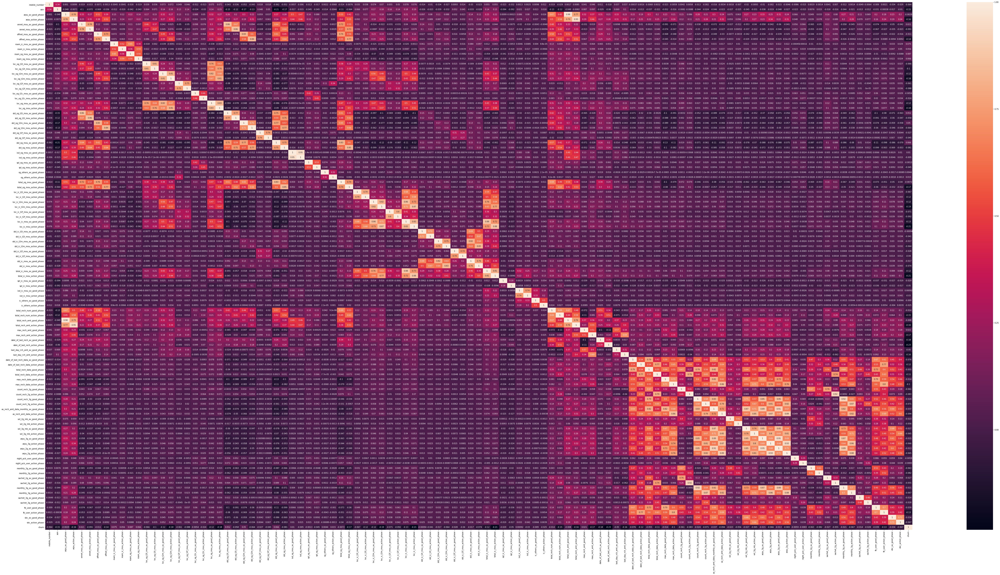

In [75]:
## checking correlation in the data 
%matplotlib inline
plt.figure(figsize = (100,50))
sns.heatmap(telecom_high_value.corr(),annot = True)

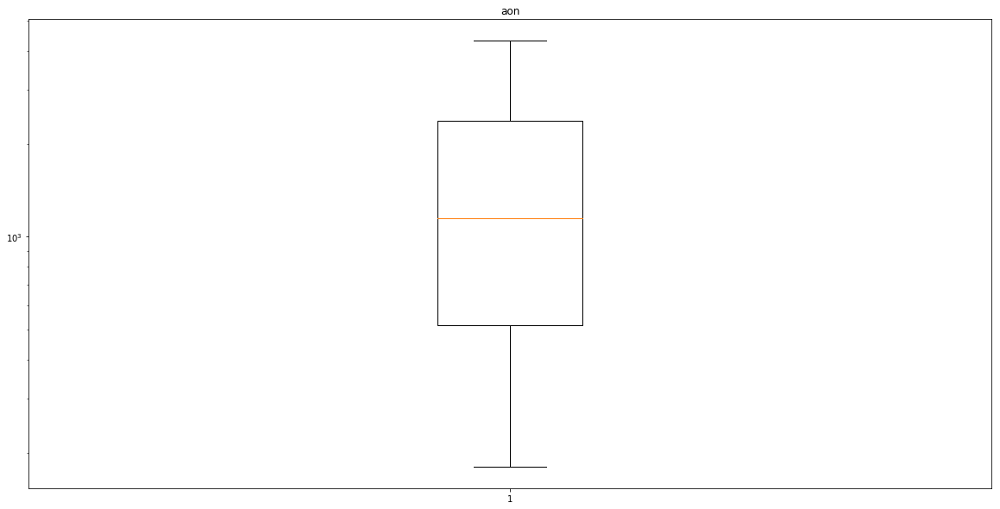

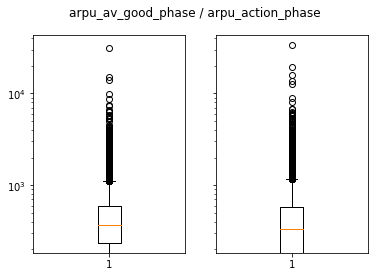

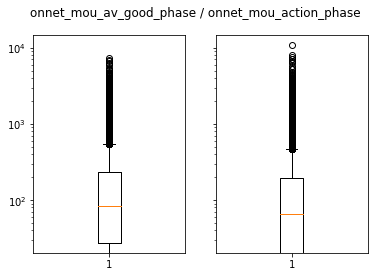

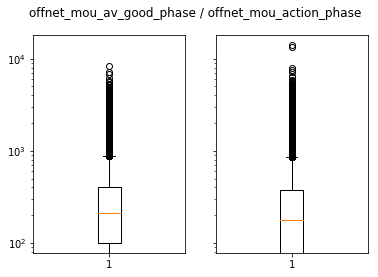

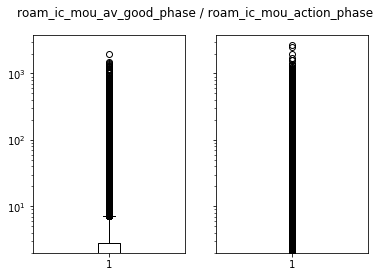

...

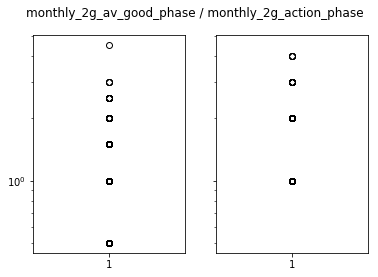

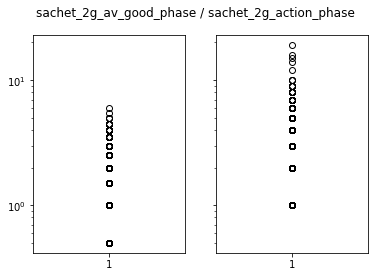

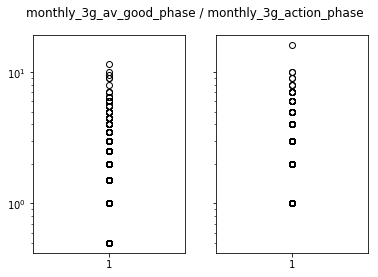

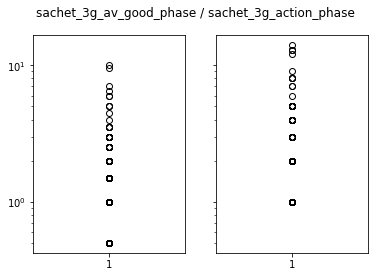

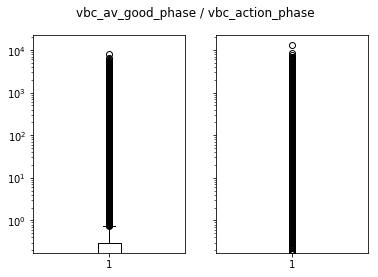

In [74]:
## getting non-dummy variables list
non_dummy_variables = telecom_high_value.columns
non_dummy_variables = non_dummy_variables.drop(['mobile_number','night_pck_user_good_phase',
                                                'night_pck_user_action_phase','fb_user_good_phase',
                                                'fb_user_action_phase','churn'])


## plotting all the non-dummy variables in the box plot


plt.figure(figsize = (20,10))
plt.boxplot(telecom_high_value[non_dummy_variables[0]])
plt.title(non_dummy_variables[0])
plt.yscale('log')
plt.show()

idx=1
while idx < (non_dummy_variables.size-1) :
    f, (good, action) = plt.subplots(1, 2, sharey=True)
    good.boxplot(telecom_high_value[non_dummy_variables[idx]])
    action.boxplot(telecom_high_value[non_dummy_variables[idx+1]])
    f.suptitle(non_dummy_variables[idx]+" / "+ non_dummy_variables[idx+1])
    idx=idx+2
    plt.yscale('log')
    plt.show()



# Models Building

### Data Preparation for Logistic Models

#### Splitting Data into Training and Test Sets

In [75]:
# Putting feature variable to X
X = telecom_high_value.drop(['mobile_number','churn'],axis=1)

# Putting response variable to y
y = telecom_high_value['churn']

X.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,...,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
0,968,206.1005,213.803,0.000,0.00,0.000,0.00,0.000,0.00,0.000,...,0.0,0,1.0,1,0.0,0,1,1.0,50.600,30.40
2,1103,178.3740,210.226,33.390,37.26,181.960,208.36,0.000,0.00,0.000,...,0.0,0,0.0,0,0.0,0,0,0.0,2.085,0.00
7,802,1209.5150,3171.480,56.260,52.29,510.295,325.91,24.860,31.64,18.165,...,0.0,0,0.0,0,0.0,0,0,0.0,19.060,57.74
9,902,183.4765,170.231,32.000,22.43,58.820,78.34,0.000,0.00,0.000,...,0.0,0,0.0,0,0.0,0,1,0.0,0.000,0.00
13,2607,349.2585,593.260,305.075,534.24,266.295,482.46,83.885,72.11,21.620,...,0.0,3,0.0,0,0.0,0,0,1.0,0.000,0.00


In [76]:
from sklearn.model_selection import train_test_split
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [77]:
## scaling the  non-dummy variables with min-max scaling
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train[non_dummy_variables]=scaler.fit_transform(X_train[non_dummy_variables])
X_train.head()

/Users/sachitachauhan/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,...,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
33510,0.555663,0.125386,0.078909,0.009580,0.005370,0.017258,0.019842,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0,0.0,0.000013,0.000000
25392,0.073654,0.121820,0.071465,0.013716,0.016613,0.023992,0.027351,0.001751,0.000000,0.012280,...,0.0,0.0,0.000000,0.0,0.0,0.0,0,0.0,0.000000,0.000000
63251,0.671094,0.112903,0.085063,0.000227,0.003658,0.000675,0.007381,0.000546,0.014845,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,1,1.0,0.056731,0.099383
97628,0.324318,0.264884,0.146792,0.048847,0.028597,0.113429,0.075418,0.056847,0.000000,0.061784,...,0.2,0.0,0.043478,0.0,0.1,0.0,1,1.0,0.077506,0.070517
20699,0.048298,0.106445,0.047022,0.000941,0.000092,0.014434,0.006028,0.005709,0.000000,0.001576,...,0.0,0.0,0.000000,0.0,0.0,0.0,0,0.0,0.000000,0.000000


In [78]:
## describing the train data after it is scaled
## to check for appropriate scaling
X_train.describe()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,...,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
count,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,...,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000,20962.000000
mean,0.305938,0.152531,0.093088,0.030154,0.018594,0.048782,0.021680,0.009449,0.007411,0.009552,...,0.019154,0.010267,0.015050,0.010772,0.004098,0.003128,0.310705,0.254794,0.013756,0.013469
std,0.249625,0.046621,0.049319,0.052377,0.036692,0.059477,0.030243,0.040377,0.038762,0.036996,...,0.071754,0.039712,0.046084,0.036191,0.024019,0.023536,0.462793,0.435756,0.043141,0.044300
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.080898,0.123230,0.062259,0.003749,0.001444,0.014541,0.004691,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.232794,0.140252,0.081127,0.011530,0.006124,0.030751,0.012597,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.529341,0.167455,0.109667,0.031867,0.018258,0.059761,0.027138,0.001897,0.000000,0.002239,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000013,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


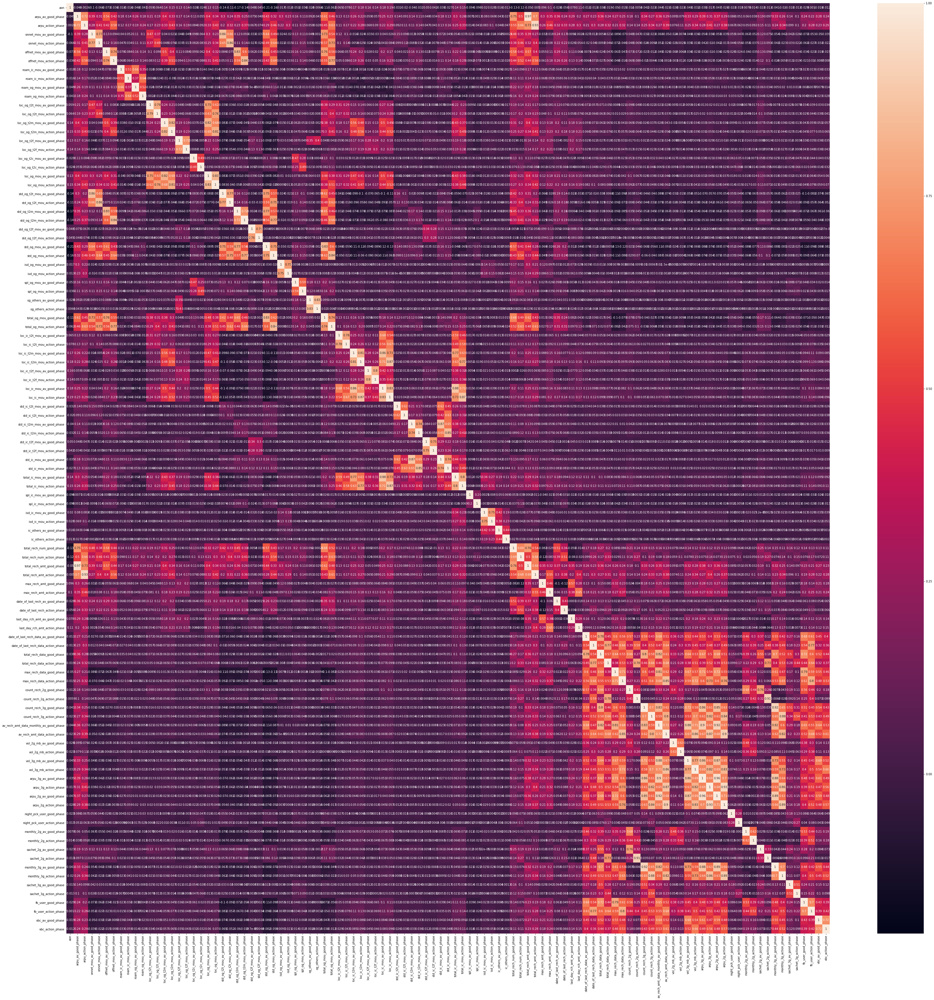

In [81]:
## In order to understand the correlation numerically for train set
## we need to prroduce the heat map to provide the directions going further
plt.figure(figsize = (60, 60))
sns.heatmap(X_train.corr(), annot = True)
plt.show()

## Logistic Training Models

### First training model using Basic Logistic Regression (with all variables)

In [82]:
import statsmodels.api as sm
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20862
Model Family:                Binomial   Df Model:                           99
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3729.5
Date:                Mon, 13 May 2019   Deviance:                       7459.1
Time:                        02:40:48   Pearson chi2:                 3.91e+06
No. Iterations:                     8   Covariance Type:             nonrobust
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                      0.4766      0.341      1.399      0.162      -0.191       1.144
aon                                       -0.8621      0.160     -5.404      0.000      -1.175      -0.549
arpu_av_good_phase                         4.3429      2.913      1.491      0.136      -1.367      10.053
arpu_action_phase                          2.6966      2.640      1.021      0.307      -2.478       7.872
onnet_mou_av_good_phase                   12.2124     43.874      0.278      0.781     -73.778      98.203
onnet_mou_action_phase                     1.4927     60.316      0.025      0.980    -116.725     119.711
offnet_mou_av_good_phase                  13.0747     40.692      0.321      0.748     -66.681      92.830
offnet_mou_action_phase                    1.1813     77.722      0.015      0.988    -151.150     153.513
roam_ic_mou_av_good_phase                  2.9970      0.860      3.483      0.000       1.310       4.684
roam_ic_mou_action_phase                  -2.5623      0.940     -2.727      0.006      -4.404      -0.721
roam_og_mou_av_good_phase                 -1.9767     14.364     -0.138      0.891     -30.129      26.176
roam_og_mou_action_phase                  -1.0941     19.554     -0.056      0.955     -39.420      37.232
loc_og_t2t_mou_av_good_phase            8.766e+04   4.58e+04      1.914      0.056   -2110.687    1.77e+05
loc_og_t2t_mou_action_phase             5.398e+05   7.22e+04      7.475      0.000    3.98e+05    6.81e+05
loc_og_t2m_mou_av_good_phase            4.548e+04   2.38e+04      1.914      0.056   -1096.674    9.21e+04
loc_og_t2m_mou_action_phase             1.678e+05   2.24e+04      7.475      0.000    1.24e+05    2.12e+05
loc_og_t2f_mou_av_good_phase            1.964e+04   1.03e+04      1.913      0.056    -477.023    3.98e+04
loc_og_t2f_mou_action_phase             2.718e+04   3635.695      7.475      0.000    2.01e+04    3.43e+04
loc_og_t2c_mou_av_good_phase              -2.6658      1.702     -1.566      0.117      -6.002       0.671
loc_og_t2c_mou_action_phase                4.8411      1.930      2.508      0.012       1.058       8.624
loc_og_mou_av_good_phase                -1.13e+05   6.75e+04     -1.673      0.094   -2.45e+05    1.93e+04
loc_og_mou_action_phase                -1.568e+05   1.01e+05     -1.560      0.119   -3.54e+05    4.02e+04
std_og_t2t_mou_av_good_phase           -4.886e+04   6.94e+04     -0.704      0.482   -1.85e+05    8.72e+04
std_og_t2t_mou_action_phase             3.814e+04   5.94e+04      0.642      0.521   -7.83e+04    1.55e+05
std_og_t2m_mou_av_good_phase           -3.799e+04    5.4e+04     -0.704      0.482   -1.44e+05    6.78e+04
std_og_t2m_mou_action_phase             7.989e+04   1.24e+05      0.642      0.521   -1.64e+05    3.24e+05
std_og_t2f_mou_av_good_phase           -2361.7793   3357.41

This model contains lots of insignificant values and tuning this model will eventually involve dropping multiple vaiables one by one. Additionally, this is also not considering class-imbalance. Therefore, we limit here with this model and then proceed Logistic regression with GLM using RFE further. 

## Logistic Regression Training Model With Recursive Feature Elimination

In [83]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
## taking into account class imbalance
logreg = LogisticRegression(class_weight='balanced')

## running RFE with 25 variables as output
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 25)             
rfe = rfe.fit(X_train, y_train)

In [84]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('aon', False, 14),
 ('arpu_av_good_phase', True, 1),
 ('arpu_action_phase', True, 1),
 ('onnet_mou_av_good_phase', False, 37),
 ('onnet_mou_action_phase', False, 6),
 ('offnet_mou_av_good_phase', False, 32),
 ('offnet_mou_action_phase', False, 2),
 ('roam_ic_mou_av_good_phase', True, 1),
 ('roam_ic_mou_action_phase', False, 41),
 ('roam_og_mou_av_good_phase', True, 1),
 ('roam_og_mou_action_phase', False, 7),
 ('loc_og_t2t_mou_av_good_phase', False, 38),
 ('loc_og_t2t_mou_action_phase', False, 26),
 ('loc_og_t2m_mou_av_good_phase', False, 71),
 ('loc_og_t2m_mou_action_phase', True, 1),
 ('loc_og_t2f_mou_av_good_phase', False, 63),
 ('loc_og_t2f_mou_action_phase', True, 1),
 ('loc_og_t2c_mou_av_good_phase', False, 44),
 ('loc_og_t2c_mou_action_phase', False, 23),
 ('loc_og_mou_av_good_phase', False, 43),
 ('loc_og_mou_action_phase', True, 1),
 ('std_og_t2t_mou_av_good_phase', False, 18),
 ('std_og_t2t_mou_action_phase', False, 17),
 ('std_og_t2m_mou_av_good_phase', False, 60),
 ('std_

In [85]:
## list of all the support variables
col = X_train.columns[rfe.support_]
col

Index(['arpu_av_good_phase', 'arpu_action_phase', 'roam_ic_mou_av_good_phase',
       'roam_og_mou_av_good_phase', 'loc_og_t2m_mou_action_phase',
       'loc_og_t2f_mou_action_phase', 'loc_og_mou_action_phase',
       'std_og_t2f_mou_action_phase', 'std_og_mou_av_good_phase',
       'std_og_mou_action_phase', 'total_og_mou_action_phase',
       'loc_ic_t2t_mou_action_phase', 'loc_ic_t2m_mou_action_phase',
       'loc_ic_mou_action_phase', 'std_ic_mou_action_phase',
       'total_ic_mou_av_good_phase', 'total_ic_mou_action_phase',
       'spl_ic_mou_action_phase', 'max_rech_amt_good_phase',
       'max_rech_amt_action_phase', 'last_day_rch_amt_action_phase',
       'total_rech_data_action_phase', 'max_rech_data_good_phase',
       'max_rech_data_action_phase', 'monthly_2g_av_good_phase'],
      dtype='object')

In [86]:
## creating model and checking the summary for significance of all variables
X_train_sm = sm.add_constant(X_train[col])
logm25 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm25.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20936
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4252.3
Date:                Mon, 13 May 2019   Deviance:                       8504.6
Time:                        02:43:50   Pearson chi2:                 6.25e+12
No. Iterations:                     8   Covariance Type:             nonrobust
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3568      0.123    -11.049      0.000      -1.598      -1.116
arpu_av_good_phase                7.3023      1.182      6.175      0.000       4.985       9.620
arpu_action_phase                -4.8414      1.545     -3.134      0.002      -7.869      -1.814
roam_ic_mou_av_good_phase         1.8226      0.694      2.626      0.009       0.462       3.183
roam_og_mou_av_good_phase         3.5271      0.802      4.395      0.000       1.954       5.100
loc_og_t2m_mou_action_phase      -4.9695      2.662     -1.867      0.062     -10.186       0.247
loc_og_t2f_mou_action_phase      -4.5203      2.387     -1.894      0.058      -9.199       0.159
loc_og_mou_action_phase         -17.2581     14.979     -1.152      0.249     -46.616      12.100
std_og_t2f_mou_action_phase      -9.0956      3.892     -2.337      0.019     -16.723      -1.468
std_og_mou_av_good_phase          2.4526      0.635      3.865      0.000       1.209       3.696
std_og_mou_action_phase         -19.0167     17.874     -1.064      0.287     -54.049      16.016
total_og_mou_action_phase         5.7064     17.995      0.317      0.751     -29.563      40.975
loc_ic_t2t_mou_action_phase       2.9510     17.688      0.167      0.867     -31.716      37.618
loc_ic_t2m_mou_action_phase      -8.4712     10.099     -0.839      0.402     -28.265      11.322
loc_ic_mou_action_phase         -47.3005     16.752     -2.824      0.005     -80.135     -14.466
std_ic_mou_action_phase         -23.7575      5.490     -4.328      0.000     -34.517     -12.998
total_ic_mou_av_good_phase       10.6228      1.307      8.130      0.000       8.062      13.184
total_ic_mou_action_phase        -6.7898      2.835     -2.395      0.017     -12.347      -1.232
spl_ic_mou_action_phase         -21.1993      3.611     -5.870      0.000     -28.278     -14.121
max_rech_amt_good_phase           2.3640      0.611      3.867      0.000       1.166       3.562
max_rech_amt_action_phase        -3.6930      1.419     -2.603      0.009      -6.473      -0.913
last_day_rch_amt_action_phase   -21.3359      1.993    -10.707      0.000     -25.242     -17.430
total_rech_data_action_phase     -5.3810      1.188     -4.530      0.000      -7.709      -3.053
max_rech_data_good_phase          2.0578      0.490      4.200      0.000       1.097       3.018
max_rech_data_action_phase       -4.2231      0.943     -4.477      0.000      -6.072      -2.374
monthly_2g_av_good_phase         -2.9605      0.622     -4.758      0.000      -4.180      -1.741
=================================================================================================
"""

#### Check the VIF now

In [87]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [88]:
## check the VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,total_og_mou_action_phase,644.52
10,std_og_mou_action_phase,466.85
7,loc_og_mou_action_phase,184.93
14,loc_ic_mou_action_phase,51.11
13,loc_ic_t2m_mou_action_phase,23.37
17,total_ic_mou_action_phase,19.31
0,const,16.25
12,loc_ic_t2t_mou_action_phase,10.11
2,arpu_action_phase,4.30
15,std_ic_mou_action_phase,4.08


In [89]:
## dropping the variable "loc_ic_t2t_mou_action_phase" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('loc_ic_t2t_mou_action_phase',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm24 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm24.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20937
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4252.3
Date:                Mon, 13 May 2019   Deviance:                       8504.6
Time:                        02:45:18   Pearson chi2:                 6.32e+12
No. Iterations:                     8   Covariance Type:             nonrobust
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3574      0.123    -11.057      0.000      -1.598      -1.117
arpu_av_good_phase                7.3079      1.182      6.182      0.000       4.991       9.625
arpu_action_phase                -4.8415      1.545     -3.134      0.002      -7.870      -1.813
roam_ic_mou_av_good_phase         1.8221      0.694      2.625      0.009       0.461       3.183
roam_og_mou_av_good_phase         3.5290      0.803      4.396      0.000       1.956       5.102
loc_og_t2m_mou_action_phase      -4.9916      2.652     -1.882      0.060     -10.190       0.207
loc_og_t2f_mou_action_phase      -4.5979      2.345     -1.960      0.050      -9.195      -0.001
loc_og_mou_action_phase         -17.1792     14.962     -1.148      0.251     -46.505      12.146
std_og_t2f_mou_action_phase      -9.1027      3.893     -2.338      0.019     -16.733      -1.472
std_og_mou_av_good_phase          2.4505      0.634      3.863      0.000       1.207       3.694
std_og_mou_action_phase         -19.0332     17.871     -1.065      0.287     -54.060      15.994
total_og_mou_action_phase         5.7347     17.992      0.319      0.750     -29.528      40.998
loc_ic_t2m_mou_action_phase      -9.8988      5.312     -1.864      0.062     -20.310       0.512
loc_ic_mou_action_phase         -44.7758      7.075     -6.329      0.000     -58.642     -30.910
std_ic_mou_action_phase         -23.7686      5.489     -4.330      0.000     -34.528     -13.010
total_ic_mou_av_good_phase       10.6268      1.306      8.134      0.000       8.066      13.187
total_ic_mou_action_phase        -6.7934      2.836     -2.395      0.017     -12.352      -1.235
spl_ic_mou_action_phase         -21.1960      3.611     -5.869      0.000     -28.274     -14.118
max_rech_amt_good_phase           2.3613      0.611      3.864      0.000       1.163       3.559
max_rech_amt_action_phase        -3.6918      1.419     -2.602      0.009      -6.472      -0.911
last_day_rch_amt_action_phase   -21.3370      1.993    -10.707      0.000     -25.243     -17.431
total_rech_data_action_phase     -5.3801      1.188     -4.529      0.000      -7.708      -3.052
max_rech_data_good_phase          2.0577      0.490      4.200      0.000       1.097       3.018
max_rech_data_action_phase       -4.2248      0.943     -4.479      0.000      -6.074      -2.376
monthly_2g_av_good_phase         -2.9619      0.622     -4.761      0.000      -4.181      -1.743
=================================================================================================
"""

In [90]:
## checking VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,total_og_mou_action_phase,644.52
10,std_og_mou_action_phase,466.85
7,loc_og_mou_action_phase,184.91
16,total_ic_mou_action_phase,19.31
0,const,16.23
13,loc_ic_mou_action_phase,16.21
12,loc_ic_t2m_mou_action_phase,4.73
2,arpu_action_phase,4.30
14,std_ic_mou_action_phase,4.08
1,arpu_av_good_phase,3.56


In [91]:
## dropping the variable "total_og_mou_action_phase" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('total_og_mou_action_phase',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm23 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm23.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20938
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4252.4
Date:                Mon, 13 May 2019   Deviance:                       8504.7
Time:                        02:46:48   Pearson chi2:                 6.00e+12
No. Iterations:                     8   Covariance Type:             nonrobust
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3670      0.119    -11.489      0.000      -1.600      -1.134
arpu_av_good_phase                7.3527      1.173      6.271      0.000       5.055       9.651
arpu_action_phase                -4.7162      1.495     -3.155      0.002      -7.646      -1.786
roam_ic_mou_av_good_phase         1.8176      0.694      2.619      0.009       0.457       3.178
roam_og_mou_av_good_phase         3.4921      0.794      4.396      0.000       1.935       5.049
loc_og_t2m_mou_action_phase      -5.0239      2.651     -1.895      0.058     -10.220       0.172
loc_og_t2f_mou_action_phase      -4.5928      2.344     -1.959      0.050      -9.187       0.002
loc_og_mou_action_phase         -12.6998      5.151     -2.466      0.014     -22.795      -2.604
std_og_t2f_mou_action_phase      -9.0961      3.892     -2.337      0.019     -16.725      -1.468
std_og_mou_av_good_phase          2.4350      0.632      3.850      0.000       1.195       3.675
std_og_mou_action_phase         -13.3661      1.877     -7.119      0.000     -17.046      -9.686
loc_ic_t2m_mou_action_phase      -9.8968      5.311     -1.863      0.062     -20.306       0.512
loc_ic_mou_action_phase         -44.8023      7.068     -6.338      0.000     -58.656     -30.948
std_ic_mou_action_phase         -23.8003      5.483     -4.341      0.000     -34.546     -13.054
total_ic_mou_av_good_phase       10.6222      1.299      8.179      0.000       8.077      13.168
total_ic_mou_action_phase        -6.7596      2.821     -2.396      0.017     -12.289      -1.230
spl_ic_mou_action_phase         -21.1850      3.611     -5.866      0.000     -28.263     -14.107
max_rech_amt_good_phase           2.3481      0.610      3.850      0.000       1.153       3.543
max_rech_amt_action_phase        -3.7194      1.418     -2.623      0.009      -6.498      -0.940
last_day_rch_amt_action_phase   -21.3394      1.993    -10.706      0.000     -25.246     -17.433
total_rech_data_action_phase     -5.3941      1.188     -4.542      0.000      -7.722      -3.066
max_rech_data_good_phase          2.0529      0.490      4.192      0.000       1.093       3.013
max_rech_data_action_phase       -4.2347      0.943     -4.489      0.000      -6.083      -2.386
monthly_2g_av_good_phase         -2.9619      0.622     -4.761      0.000      -4.181      -1.743
=================================================================================================
"""

In [92]:
## checking VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
15,total_ic_mou_action_phase,19.21
12,loc_ic_mou_action_phase,16.14
0,const,15.61
11,loc_ic_t2m_mou_action_phase,4.73
13,std_ic_mou_action_phase,4.06
2,arpu_action_phase,3.99
1,arpu_av_good_phase,3.54
5,loc_og_t2m_mou_action_phase,3.51
9,std_og_mou_av_good_phase,3.45
10,std_og_mou_action_phase,3.42


In [93]:
## dropping the variable "loc_ic_t2m_mou_action_phase" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('loc_ic_t2m_mou_action_phase',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm22 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm22.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20939
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4254.1
Date:                Mon, 13 May 2019   Deviance:                       8508.1
Time:                        02:48:56   Pearson chi2:                 6.39e+12
No. Iterations:                     8   Covariance Type:             nonrobust
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3697      0.119    -11.520      0.000      -1.603      -1.137
arpu_av_good_phase                7.3273      1.170      6.261      0.000       5.034       9.621
arpu_action_phase                -4.5980      1.491     -3.083      0.002      -7.521      -1.675
roam_ic_mou_av_good_phase         1.8264      0.696      2.625      0.009       0.463       3.190
roam_og_mou_av_good_phase         3.4613      0.794      4.359      0.000       1.905       5.018
loc_og_t2m_mou_action_phase      -6.5343      2.462     -2.655      0.008     -11.359      -1.710
loc_og_t2f_mou_action_phase      -4.4143      2.333     -1.892      0.058      -8.986       0.158
loc_og_mou_action_phase         -10.7963      4.672     -2.311      0.021     -19.952      -1.640
std_og_t2f_mou_action_phase      -9.0997      3.894     -2.337      0.019     -16.732      -1.467
std_og_mou_av_good_phase          2.4376      0.632      3.859      0.000       1.199       3.676
std_og_mou_action_phase         -13.4137      1.877     -7.148      0.000     -17.092      -9.736
loc_ic_mou_action_phase         -55.6408      4.257    -13.072      0.000     -63.984     -47.298
std_ic_mou_action_phase         -23.6562      5.479     -4.318      0.000     -34.394     -12.918
total_ic_mou_av_good_phase       10.6291      1.285      8.269      0.000       8.110      13.148
total_ic_mou_action_phase        -6.8140      2.817     -2.418      0.016     -12.336      -1.292
spl_ic_mou_action_phase         -21.2816      3.615     -5.888      0.000     -28.366     -14.197
max_rech_amt_good_phase           2.3424      0.610      3.840      0.000       1.147       3.538
max_rech_amt_action_phase        -3.7672      1.419     -2.655      0.008      -6.548      -0.986
last_day_rch_amt_action_phase   -21.2857      1.993    -10.679      0.000     -25.192     -17.379
total_rech_data_action_phase     -5.3916      1.188     -4.540      0.000      -7.719      -3.064
max_rech_data_good_phase          2.0429      0.489      4.176      0.000       1.084       3.002
max_rech_data_action_phase       -4.2425      0.943     -4.498      0.000      -6.091      -2.394
monthly_2g_av_good_phase         -2.9624      0.622     -4.764      0.000      -4.181      -1.744
=================================================================================================
"""

In [94]:
## checking VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,total_ic_mou_action_phase,19.20
0,const,15.61
11,loc_ic_mou_action_phase,13.18
12,std_ic_mou_action_phase,4.06
2,arpu_action_phase,3.99
1,arpu_av_good_phase,3.53
9,std_og_mou_av_good_phase,3.45
10,std_og_mou_action_phase,3.42
7,loc_og_mou_action_phase,3.15
5,loc_og_t2m_mou_action_phase,3.14


In [95]:
## dropping the variable "total_ic_mou_action_phase" from the data set
## and creating the model again with remaining varibles of RFE
col = col.drop('total_ic_mou_action_phase',1)
X_train_sm = sm.add_constant(X_train[col]) 
logm21 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm21.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20962
Model:                            GLM   Df Residuals:                    20940
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4257.8
Date:                Mon, 13 May 2019   Deviance:                       8515.7
Time:                        02:50:17   Pearson chi2:                 8.19e+12
No. Iterations:                     8   Covariance Type:             nonrobust
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -1.3745      0.119    -11.516      0.000      -1.608      -1.141
arpu_av_good_phase                7.5813      1.170      6.477      0.000       5.287       9.875
arpu_action_phase                -4.8550      1.478     -3.285      0.001      -7.752      -1.958
roam_ic_mou_av_good_phase         1.8773      0.692      2.711      0.007       0.520       3.234
roam_og_mou_av_good_phase         3.4156      0.792      4.314      0.000       1.864       4.967
loc_og_t2m_mou_action_phase      -6.5614      2.467     -2.660      0.008     -11.397      -1.726
loc_og_t2f_mou_action_phase      -4.6021      2.340     -1.967      0.049      -9.188      -0.016
loc_og_mou_action_phase         -10.7158      4.712     -2.274      0.023     -19.951      -1.481
std_og_t2f_mou_action_phase      -8.9146      3.879     -2.298      0.022     -16.518      -1.311
std_og_mou_av_good_phase          2.4766      0.633      3.912      0.000       1.236       3.717
std_og_mou_action_phase         -13.4494      1.875     -7.173      0.000     -17.124      -9.774
loc_ic_mou_action_phase         -61.2320      3.477    -17.610      0.000     -68.047     -54.417
std_ic_mou_action_phase         -31.1433      4.752     -6.554      0.000     -40.456     -21.830
total_ic_mou_av_good_phase        9.0882      1.119      8.119      0.000       6.894      11.282
spl_ic_mou_action_phase         -21.4049      3.618     -5.917      0.000     -28.495     -14.314
max_rech_amt_good_phase           2.3397      0.611      3.831      0.000       1.143       3.537
max_rech_amt_action_phase        -3.7956      1.421     -2.671      0.008      -6.581      -1.010
last_day_rch_amt_action_phase   -21.2954      1.992    -10.691      0.000     -25.200     -17.391
total_rech_data_action_phase     -5.3322      1.180     -4.518      0.000      -7.645      -3.019
max_rech_data_good_phase          2.0214      0.489      4.132      0.000       1.063       2.980
max_rech_data_action_phase       -4.2836      0.939     -4.564      0.000      -6.123      -2.444
monthly_2g_av_good_phase         -2.9044      0.618     -4.699      0.000      -4.116      -1.693
=================================================================================================
"""

In [96]:
## checking VIF now
vif = pd.DataFrame()
X = X_train_sm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,15.61
2,arpu_action_phase,3.93
1,arpu_av_good_phase,3.52
9,std_og_mou_av_good_phase,3.45
10,std_og_mou_action_phase,3.42
7,loc_og_mou_action_phase,3.14
5,loc_og_t2m_mou_action_phase,3.14
11,loc_ic_mou_action_phase,2.78
20,max_rech_data_action_phase,2.77
13,total_ic_mou_av_good_phase,2.73


In [97]:
## Making predictions now
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

33510    4.427066e-02
25392    9.260138e-02
63251    1.395272e-02
97628    2.556955e-05
20699    2.728273e-02
4793     4.294968e-07
82660    6.060468e-04
74050    1.483778e-01
92154    2.648517e-05
47382    4.962432e-03
dtype: float64

In [98]:
## reshaping the values to get an array
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([4.42706594e-02, 9.26013817e-02, 1.39527235e-02, 2.55695527e-05,
       2.72827258e-02, 4.29496754e-07, 6.06046806e-04, 1.48377848e-01,
       2.64851663e-05, 4.96243188e-03])

In [99]:
## putting the model provided probability values and the actual values in a dataframe along with row numbers
y_train_pred_df = pd.DataFrame({'churn':y_train.values, 'churn_pred':y_train_pred})
y_train_pred_df['id'] = y_train.index
y_train_pred_df.head()

,churn,churn_pred,mobile_number
0,0,0.044271,33510
1,0,0.092601,25392
2,0,0.013953,63251
3,0,0.000026,97628
4,0,0.027283,20699


In [100]:
## making prediction with any arbitrary cut-off value
y_train_pred_df['prediction']= y_train_pred_df.churn_pred.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_df.head()

,churn,churn_pred,mobile_number,prediction
0,0,0.044271,33510,0
1,0,0.092601,25392,0
2,0,0.013953,63251,0
3,0,0.000026,97628,0
4,0,0.027283,20699,0


In [101]:
## checking accuracy
from sklearn import metrics
print(metrics.accuracy_score(y_train_pred_df.churn, y_train_pred_df.prediction))

0.917851350062017


#### Plotting ROC Curve

In [102]:
## function to draw the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for model')
    plt.legend(loc="lower right")
    plt.show()

    return None

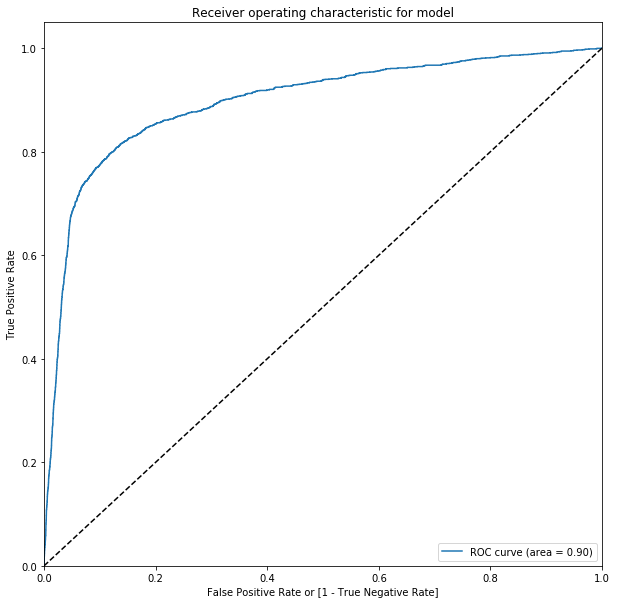

In [103]:
## using roc_cuve from the matrics
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_df.churn, y_train_pred_df.prediction, drop_intermediate = False )
## draw ROC curve based on the probability values generated by the model
draw_roc(y_train_pred_df.churn, y_train_pred_df.churn_pred)

#### Finding Optimal Cutoff Point

In [104]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.churn_pred.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,churn,churn_pred,mobile_number,prediction,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.044271,33510,0,1,0,0,0,0,0,0,0,0,0
1,0,0.092601,25392,0,1,0,0,0,0,0,0,0,0,0
2,0,0.013953,63251,0,1,0,0,0,0,0,0,0,0,0
3,0,0.000026,97628,0,1,0,0,0,0,0,0,0,0,0
4,0,0.027283,20699,0,1,0,0,0,0,0,0,0,0,0


In [105]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','ppv','npv'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_df.churn, y_train_pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
    npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,ppv, npv ]
print(cutoff_df)

     prob  accuracy     sensi     speci       ppv       npv
0.0   0.0  0.090926  1.000000  0.000000  0.090926       NaN
0.1   0.1  0.811898  0.849948  0.808092  0.306993  0.981766
0.2   0.2  0.896098  0.764953  0.909215  0.457340  0.974795
0.3   0.3  0.926915  0.675236  0.952089  0.585000  0.967008
0.4   0.4  0.924816  0.427597  0.974549  0.626923  0.944512
0.5   0.5  0.917851  0.224029  0.987248  0.637313  0.927114
0.6   0.6  0.915371  0.124869  0.994437  0.691860  0.919100
0.7   0.7  0.911697  0.058762  0.997009  0.662722  0.913721
0.8   0.8  0.911029  0.030955  0.999055  0.766234  0.911563
0.9   0.9  0.910028  0.012592  0.999790  0.857143  0.910098


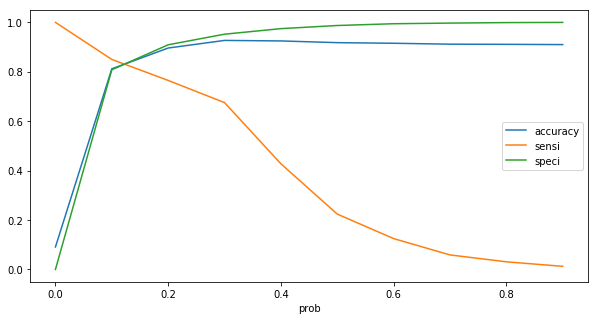

In [106]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'],figsize=(10, 5))
plt.show()

In [107]:
## making our final prediction on basis of optimal cut-off of 0.17
y_train_pred_df['final_predicted'] = y_train_pred_df.churn_pred.map( lambda x: 1 if x > 0.17 else 0)
y_train_pred_df.head()

,churn,churn_pred,mobile_number,prediction,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.044271,33510,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.092601,25392,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.013953,63251,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.000026,97628,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.027283,20699,0,1,0,0,0,0,0,0,0,0,0,0


In [108]:
## creating confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train_pred_df.churn, y_train_pred_df.final_predicted )
confusion_matrix

array([[16916,  2140],
       [  403,  1503]], dtype=int64)

In [109]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_df.churn, y_train_pred_df.final_predicted)

0.8786852399580193

In [110]:
from sklearn.metrics import precision_score, recall_score
## using precision_score to evaluate matrics
print("precision : ", precision_score(y_train_pred_df.churn, y_train_pred_df.final_predicted))
## using recall_score to evaluate matrics
print("recall : ", recall_score(y_train_pred_df.churn, y_train_pred_df.final_predicted))

precision :  0.412572055997804
recall :  0.7885624344176285


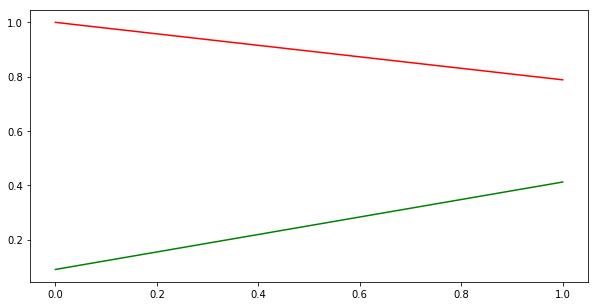

In [111]:
## using precision_recall_curve from matrics
from sklearn.metrics import precision_recall_curve
p, r, thresholds = precision_recall_curve(y_train_pred_df.churn, y_train_pred_df.final_predicted)

plt.figure(figsize=(10, 5))
plt.plot(thresholds, p[:-1], "g-", label ="precision")
plt.plot(thresholds, r[:-1], "r-", label ="recall")
plt.show()

#### Prediction on test data

In [112]:
## transforming test data
X_test[non_dummy_variables]=scaler.transform(X_test[non_dummy_variables])
X_test.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,...,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
60217,0.037431,0.142750,0.041121,0.081228,0.000024,0.040217,0.000035,0.000232,0.016052,0.005048,...,0.0,0.000000,0.000000,0.0000,0.0,0.0,0,0.0,0.000000,0.000000
26722,0.067134,0.114882,0.055677,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.086957,0.0625,0.0,0.0,1,1.0,0.004782,0.000000
82411,0.293407,0.191167,0.141431,0.004461,0.000221,0.021625,0.013183,0.000000,0.000000,0.000000,...,0.3,0.052632,0.043478,0.0625,0.0,0.0,1,1.0,0.068399,0.115000
16868,0.662400,0.219653,0.144627,0.003787,0.001216,0.011439,0.003857,0.000000,0.000000,0.000000,...,0.0,0.000000,0.130435,0.1250,0.1,0.0,1,1.0,0.213540,0.086247
38631,0.076793,0.182540,0.115643,0.142554,0.066162,0.111347,0.046311,0.000000,0.000000,0.000000,...,0.2,0.052632,0.000000,0.0000,0.0,0.0,0,0.0,0.000000,0.000000


In [113]:
## adding constant to the test dataset
X_test_sm = sm.add_constant(X_test[col])

In [114]:
## making prediction probabilities
y_test_pred = res.predict(X_test_sm)
## checking values
y_test_pred[:10]

60217    0.450346
26722    0.243723
82411    0.021843
16868    0.016987
38631    0.005434
26358    0.046236
35078    0.009095
57150    0.291506
75575    0.015587
10484    0.559969
dtype: float64

In [115]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

# Let's see the head
y_pred_1.head()

,0
60217,0.450346
26722,0.243723
82411,0.021843
16868,0.016987
38631,0.005434


In [116]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

y_test_df['id'] = y_test_df.index

In [117]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_df = pd.concat([y_test_df, y_pred_1],axis=1)
y_pred_df.head()

,churn,id,0
0,0,60217,0.450346
1,0,26722,0.243723
2,0,82411,0.021843
3,0,16868,0.016987
4,0,38631,0.005434


In [118]:
# Renaming the column 
y_pred_df= y_pred_df.rename(columns={ 0 : 'churn_pred'})

# Rearranging the columns
y_pred_df = y_pred_df.reindex_axis(['id','churn','churn_pred'], axis=1)

# Let's see the head of y_pred_df
y_pred_df.head()

,id,churn,churn_pred
0,60217,0,0.450346
1,26722,0,0.243723
2,82411,0,0.021843
3,16868,0,0.016987
4,38631,0,0.005434


In [119]:
## evaluating result based on the cut-off value obtained above
y_pred_df['final_predicted'] = y_pred_df.churn_pred.map(lambda x: 1 if x > 0.17 else 0)
y_pred_df.head()

,id,churn,churn_pred,final_predicted
0,60217,0,0.450346,1
1,26722,0,0.243723,1
2,82411,0,0.021843,0
3,16868,0,0.016987,0
4,38631,0,0.005434,0


In [120]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_df.churn, y_pred_df.final_predicted )
confusion2

array([[7265,  963],
       [ 144,  612]], dtype=int64)

In [121]:
## checking for  accuracy, precision and recall
print("accuracy : ", metrics.accuracy_score(y_pred_df.churn, y_pred_df.final_predicted))
print("precision : ", metrics.precision_score(y_pred_df.churn, y_pred_df.final_predicted))
print("recall : ", metrics.recall_score(y_pred_df.churn, y_pred_df.final_predicted))

accuracy :  0.8767809439002672
precision :  0.38857142857142857
recall :  0.8095238095238095


#### Result : The logistic regression model with RFE after tuning provided the recall value of 80.95% on test data.

## Logistic Regression Model using Regularization (L1 / L2)

In [140]:
# Grid search cross validation
from sklearn.linear_model import LogisticRegression

# grid search CV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV


# set up cross validation scheme
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# specify range of hyperparameters
params = {"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge

## using Logistic regression for class imbalance
model = LogisticRegression(class_weight='balanced')
model_cv = GridSearchCV(estimator = model, param_grid = params, 
                        scoring= 'recall', 
                        cv = folds, 
                        return_train_score=True, verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 14 candidates, totalling 70 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:  7.8min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
       error_score='raise-deprecating',
       estimator=LogisticRegression(C=1.0, class_weight='balanced', dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=None,
          solver='warn', tol=0.0001, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]), 'penalty': ['l1', 'l2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='recall', verbose=1)

In [141]:
## reviewing the results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.070919,0.006955,0.005155,0.001097,0.001,l1,"{'C': 0.001, 'penalty': 'l1'}",0.000000,0.000000,0.000000,...,0.000000,0.000000,14,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.091561,0.001191,0.005064,0.000069,0.001,l2,"{'C': 0.001, 'penalty': 'l2'}",0.612565,0.522310,0.614173,...,0.594956,0.036561,13,0.587927,0.583607,0.613115,0.582951,0.615082,0.596536,0.014454
2,0.140074,0.006063,0.004232,0.000096,0.01,l1,"{'C': 0.01, 'penalty': 'l1'}",0.727749,0.690289,0.711286,...,0.722978,0.020334,12,0.725722,0.720656,0.745574,0.721967,0.732459,0.729276,0.009123
3,0.122592,0.000857,0.005029,0.000023,0.01,l2,"{'C': 0.01, 'penalty': 'l2'}",0.767016,0.724409,0.734908,...,0.758653,0.025322,11,0.761811,0.755410,0.773115,0.754098,0.758689,0.760624,0.006796
4,0.676326,0.311020,0.004506,0.000346,0.1,l1,"{'C': 0.1, 'penalty': 'l1'}",0.827225,0.808399,0.834646,...,0.833686,0.015228,9,0.843832,0.843934,0.843934,0.834754,0.834098,0.840111,0.004646
5,0.178037,0.016621,0.005177,0.000410,0.1,l2,"{'C': 0.1, 'penalty': 'l2'}",0.808901,0.776903,0.811024,...,0.810599,0.018725,10,0.815617,0.815738,0.809180,0.806557,0.805902,0.810599,0.004289
6,1.282565,0.527154,0.007020,0.005216,1,l1,"{'C': 1.0, 'penalty': 'l1'}",0.832461,0.800525,0.842520,...,0.841032,0.023884,6,0.854331,0.854426,0.849836,0.840656,0.844590,0.848768,0.005429
7,0.293913,0.018308,0.005473,0.000369,1,l2,"{'C': 1.0, 'penalty': 'l2'}",0.832461,0.792651,0.842520,...,0.836308,0.023728,8,0.845801,0.852459,0.841967,0.838689,0.841311,0.844045,0.004782
8,3.822840,0.909194,0.004488,0.000192,10,l1,"{'C': 10.0, 'penalty': 'l1'}",0.832461,0.803150,0.845144,...,0.842082,0.023047,3,0.860236,0.860328,0.859016,0.850492,0.852459,0.856506,0.004180
9,0.440332,0.025579,0.005362,0.000133,10,l2,"{'C': 10.0, 'penalty': 'l2'}",0.829843,0.808399,0.837270,...,0.839983,0.020621,7,0.855643,0.855082,0.851148,0.845902,0.849836,0.851522,0.003584


In [142]:
## segerigating results for L1 and L2 regression and plotting them differently
cv_results_penalty_l1 = cv_results.loc[cv_results['param_penalty']=='l1']
cv_results_penalty_l2 = cv_results.loc[cv_results['param_penalty']=='l2']

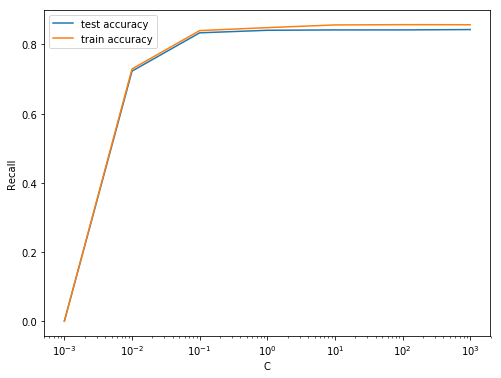

In [143]:
## plotting results for Logistic regression with L1 panelty
plt.figure(figsize=(8, 6))
plt.plot(cv_results_penalty_l1['param_C'], cv_results_penalty_l1['mean_test_score'])
plt.plot(cv_results_penalty_l1['param_C'], cv_results_penalty_l1['mean_train_score'])
plt.xlabel('C')
plt.ylabel('Recall')
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

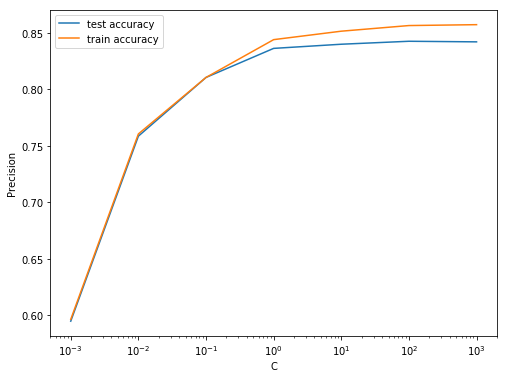

In [144]:
## plotting results for Logistic regression with L2 panelty
plt.figure(figsize=(8, 6))
plt.plot(cv_results_penalty_l2['param_C'], cv_results_penalty_l2['mean_test_score'])
plt.plot(cv_results_penalty_l2['param_C'], cv_results_penalty_l2['mean_train_score'])
plt.xlabel('C')
plt.ylabel('Recall')
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

In [145]:
## checking best score
best_score = model_cv.best_score_
best_param = model_cv.best_params_

print(" The highest test recall is {0} at {1}".format(best_score, best_param))

 The highest test recall is 0.8431315483367934 at {'C': 1000.0, 'penalty': 'l1'}


In [146]:
## preparing final model based on best score
model=LogisticRegression(C=1,penalty="l1")
model.fit(X_train,y_train)

y_pred = model.predict(X_test)

# metrics
# print other metrics

print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[7733  495]
 [ 355  401]]
accuracy 0.905387355298308
precision 0.44754464285714285
recall 0.5304232804232805


#### Result : The logistic regression model with L1 regularization after tuning provided the recall value of 53% on test data.

## Logistic model with PCA

In [79]:
# Let's see train data shape first
X_train.shape

(20962, 105)

In [80]:
#Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [81]:
#Doing the PCA on the train data
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

In [82]:
# Let's plot the principal components and try to make sense of them
# We will see pca components first
pca.components_

array([[-7.36091892e-03,  1.99614940e-02,  2.21161750e-02, ...,
         5.87738804e-01,  2.97181337e-02,  3.02677530e-02],
       [ 8.02513707e-02, -4.74132579e-02, -6.54581393e-02, ...,
        -1.41583253e-01,  8.10765178e-03, -1.97343601e-03],
       [ 3.69294966e-01, -4.64354699e-02, -2.35695121e-02, ...,
         4.48758170e-01, -1.05209156e-02,  1.94681392e-03],
       ...,
       [-0.00000000e+00, -3.48333153e-17,  6.93848570e-17, ...,
         8.93064321e-18,  3.22679457e-17,  5.10045637e-17],
       [-0.00000000e+00,  1.23016347e-17, -1.33625416e-16, ...,
         3.15199373e-17, -5.61963177e-17,  7.37543239e-17],
       [ 0.00000000e+00, -2.98774370e-17,  1.43502654e-16, ...,
        -1.72249997e-17, -1.49053102e-16, -3.58091905e-18]])

In [83]:
# Data frame with pc1 and pc2
colnames = list(X_train.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_df.head()

,PC1,PC2,Feature
0,-0.007361,0.080251,aon
1,0.019961,-0.047413,arpu_av_good_phase
2,0.022116,-0.065458,arpu_action_phase
3,-0.003373,-0.050719,onnet_mou_av_good_phase
4,-0.001184,-0.038643,onnet_mou_action_phase


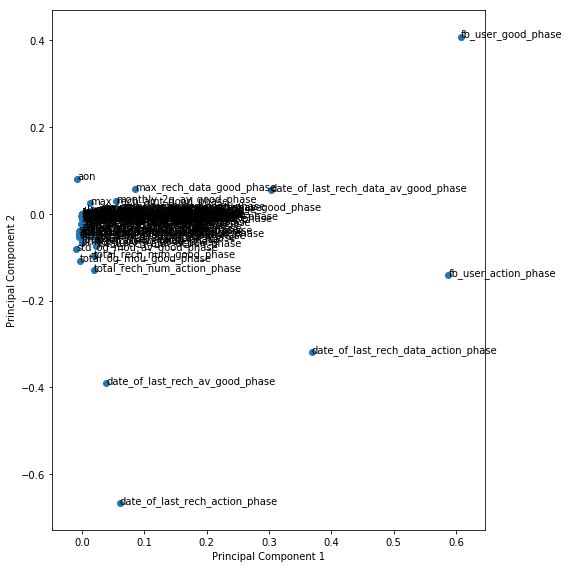

In [84]:
# Plot original features on the first 2 principal components as axes
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

#### Looking at the screeplot to assess the number of needed principal components

In [85]:
pca.explained_variance_ratio_

array([4.97239503e-01, 1.06268644e-01, 7.90654951e-02, 6.67691102e-02,
       3.97146749e-02, 3.39437390e-02, 2.82053002e-02, 2.23148909e-02,
       1.67963385e-02, 1.57136049e-02, 7.46583928e-03, 6.86616705e-03,
       6.50669495e-03, 5.90710860e-03, 5.26650534e-03, 4.55455552e-03,
       4.34893310e-03, 3.83755623e-03, 3.11328183e-03, 2.91610705e-03,
       2.88266025e-03, 2.60168369e-03, 2.49549068e-03, 2.42442988e-03,
       2.17716710e-03, 1.95460952e-03, 1.77318044e-03, 1.70712184e-03,
       1.52877239e-03, 1.44694489e-03, 1.39803751e-03, 1.22353292e-03,
       1.15552475e-03, 1.13142300e-03, 9.98068931e-04, 9.40716127e-04,
       9.28438420e-04, 8.95971104e-04, 8.40118973e-04, 7.69892931e-04,
       7.49913433e-04, 6.99790774e-04, 6.82097994e-04, 6.56825199e-04,
       6.31163130e-04, 6.18099828e-04, 5.58858077e-04, 4.94256499e-04,
       4.87484271e-04, 4.71326941e-04, 4.49970731e-04, 3.83926285e-04,
       3.70669284e-04, 3.60303152e-04, 3.19281466e-04, 3.07493965e-04,
      

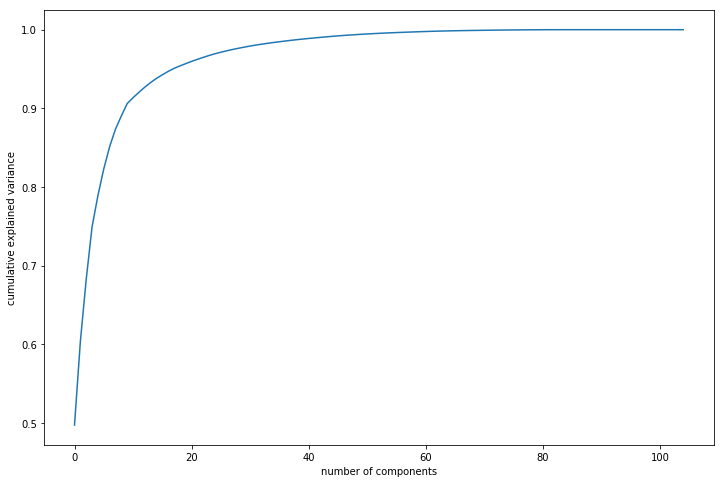

In [86]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

#### Looks like 30 components are enough to describe 95% of the variance in the dataset
- We'll choose 30 components for our modeling

In [87]:
#Using incremental PCA for efficiency - saves a lot of time on larger datasets
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=30)

In [88]:
# Basis transformation - getting the data onto our PCs
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(20962, 30)

In [89]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

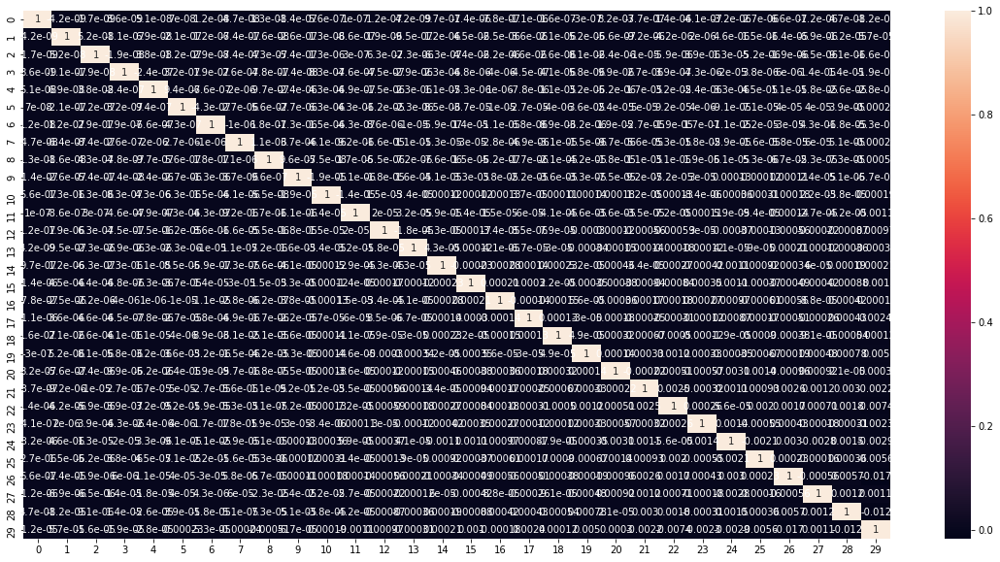

In [90]:
#### Creating correlation matrix for the principal components - we expect little to no correlation
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [91]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.005688329217690442 , min corr:  -0.016664055598209666


#### Indeed - there is no correlation between any two components! Good job, PCA!
- We effectively have removed multicollinearity from our situation, and our models will be much more stable

In [92]:
#Applying selected components to the test data 
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(8984, 30)

#### Applying a logistic regression on our Principal Components

In [93]:
#Training the model on the train data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

learner_pca = LogisticRegression(class_weight='balanced')
model_pca = learner_pca.fit(df_train_pca,y_train)

**Note**

Note that we are fitting the original variable y with the transformed variables (principal components). This is not a problem becuase the transformation done in PCA is *linear*, which implies that you've only changed the way the new x variables are represented, though the nature of relationship between X and Y is still linear. 

In [94]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.82'

In [95]:
# Converting y_pred to a dataframe which is an array
y_pred_2 = pd.DataFrame(y_test)
y_pred_2['final_predicted'] = pred_probs_test
# Let's see the head
y_pred_2.head()

,churn,final_predicted
60217,0,1.0
26722,0,1.0
82411,0,0.0
16868,0,0.0
38631,0,0.0


In [96]:
# Change final_predicted data type to int64 for calculations
pd.options.display.float_format = '{:,.0f}'.format
y_pred_2['final_predicted'] = y_pred_2['final_predicted'].astype(np.int64)
y_pred_2.head()

,churn,final_predicted
60217,0,1
26722,0,1
82411,0,0
16868,0,0
38631,0,0


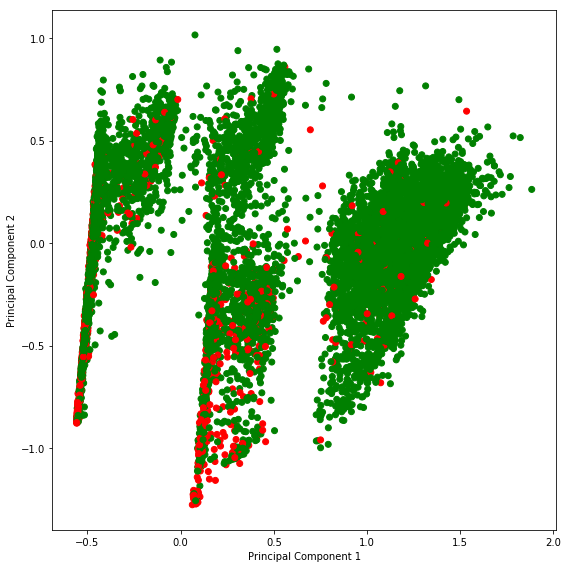

In [97]:
#Before closing, let's also visualize the data to see if we can spot any patterns
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(df_train_pca[:,0], df_train_pca[:,1], c = y_train.map({0:'green',1:'red'}))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.tight_layout()
plt.show()

In [98]:
## creating confusion matrix for test data
confusion2 = metrics.confusion_matrix(y_pred_2.churn, y_pred_2.final_predicted )
confusion2

array([[7264,  964],
       [ 231,  525]])

In [99]:
# metrics
# print other metrics

# accuracy
print("accuracy : ", metrics.accuracy_score(y_pred_2.churn, y_pred_2.final_predicted))
# precision
print("precision : ", metrics.precision_score(y_pred_2.churn, y_pred_2.final_predicted))
# recall/sensitivity
print("recall : ", metrics.recall_score(y_pred_2.churn, y_pred_2.final_predicted))

accuracy :  0.8669857524487978
precision :  0.3525856279382136
recall :  0.6944444444444444


#### Result : The logistic regression model with PCA after tuning provided the recall value of 69% on test data.

## Decision Tree Model

#### Data Preparation for Decision Tree Model

In [192]:
# Putting feature variable to X
X = telecom_high_value.drop(['mobile_number','churn'],axis=1)

# Putting response variable to y
y = telecom_high_value['churn']

X.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,...,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
0,968,206.1005,213.803,0.000,0.00,0.000,0.00,0.000,0.00,0.000,...,0.0,0,1.0,1,0.0,0,1,1.0,50.600,30.40
2,1103,178.3740,210.226,33.390,37.26,181.960,208.36,0.000,0.00,0.000,...,0.0,0,0.0,0,0.0,0,0,0.0,2.085,0.00
7,802,1209.5150,3171.480,56.260,52.29,510.295,325.91,24.860,31.64,18.165,...,0.0,0,0.0,0,0.0,0,0,0.0,19.060,57.74
9,902,183.4765,170.231,32.000,22.43,58.820,78.34,0.000,0.00,0.000,...,0.0,0,0.0,0,0.0,0,1,0.0,0.000,0.00
13,2607,349.2585,593.260,305.075,534.24,266.295,482.46,83.885,72.11,21.620,...,0.0,3,0.0,0,0.0,0,0,1.0,0.000,0.00


In [193]:
from sklearn.model_selection import train_test_split
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

#### Creating Decision Tree Model

In [213]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(class_weight='balanced',max_depth=5)
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [214]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred= dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.98      0.90      0.94      8228
          1       0.44      0.83      0.57       756

avg / total       0.94      0.90      0.91      8984



In [215]:
print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[7422  806]
 [ 128  628]]
accuracy 0.8960373998219056
precision 0.43793584379358436
recall 0.8306878306878307


In [216]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(telecom_high_value.columns[1:])
features

['aon',
 'arpu_av_good_phase',
 'arpu_action_phase',
 'onnet_mou_av_good_phase',
 'onnet_mou_action_phase',
 'offnet_mou_av_good_phase',
 'offnet_mou_action_phase',
 'roam_ic_mou_av_good_phase',
 'roam_ic_mou_action_phase',
 'roam_og_mou_av_good_phase',
 'roam_og_mou_action_phase',
 'loc_og_t2t_mou_av_good_phase',
 'loc_og_t2t_mou_action_phase',
 'loc_og_t2m_mou_av_good_phase',
 'loc_og_t2m_mou_action_phase',
 'loc_og_t2f_mou_av_good_phase',
 'loc_og_t2f_mou_action_phase',
 'loc_og_t2c_mou_av_good_phase',
 'loc_og_t2c_mou_action_phase',
 'loc_og_mou_av_good_phase',
 'loc_og_mou_action_phase',
 'std_og_t2t_mou_av_good_phase',
 'std_og_t2t_mou_action_phase',
 'std_og_t2m_mou_av_good_phase',
 'std_og_t2m_mou_action_phase',
 'std_og_t2f_mou_av_good_phase',
 'std_og_t2f_mou_action_phase',
 'std_og_mou_av_good_phase',
 'std_og_mou_action_phase',
 'isd_og_mou_av_good_phase',
 'isd_og_mou_action_phase',
 'spl_og_mou_av_good_phase',
 'spl_og_mou_action_phase',
 'og_others_av_good_phase',
 'og_o

In [217]:
# If you're on windows:
# Specifing path for dot file.
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/graphviz-2.38/release/bin/'

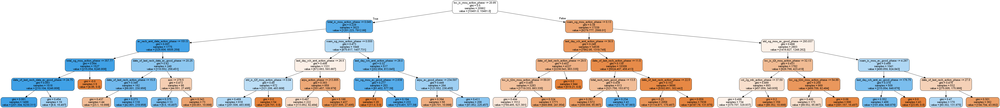

In [219]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,feature_names = list(telecom_high_value.columns[1:106]) , filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparameter Tuning

#### Tuning max_depth

In [220]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall")
tree.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(1, 40)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='recall', verbose=0)

In [221]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.153801,0.019133,0.009201,0.002402,1,{'max_depth': 1},0.748691,0.737533,0.748031,0.729659,...,0.742915,0.008052,10,0.754593,0.733770,0.779672,0.734426,0.754098,0.751312,0.016827
1,0.325598,0.071382,0.009403,0.001357,2,{'max_depth': 2},0.748691,0.737533,0.748031,0.729659,...,0.742915,0.008052,10,0.754593,0.733770,0.779672,0.734426,0.754098,0.751312,0.016827
2,0.406599,0.117398,0.008613,0.003065,3,{'max_depth': 3},0.777487,0.761155,0.779528,0.782152,...,0.772296,0.009215,7,0.783465,0.770492,0.786885,0.796066,0.790164,0.785414,0.008540
3,0.466799,0.083788,0.008804,0.002130,4,{'max_depth': 4},0.793194,0.816273,0.776903,0.758530,...,0.787511,0.019174,5,0.796588,0.832787,0.809836,0.780328,0.807869,0.805482,0.017217
4,0.560399,0.091305,0.007813,0.001461,5,{'max_depth': 5},0.798429,0.790026,0.771654,0.776903,...,0.791183,0.016776,4,0.843832,0.815082,0.830164,0.822951,0.878689,0.838143,0.022372


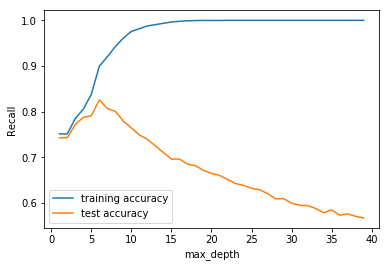

In [222]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_leaf

In [224]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall")
tree.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_leaf': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [225]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.285797,0.119293,0.008804,0.002396,5,{'min_samples_leaf': 5},0.719895,0.700787,0.700787,0.734908,...,0.711434,0.013875,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,1.081340,0.115046,0.009001,0.002281,25,{'min_samples_leaf': 25},0.795812,0.808399,0.808399,0.829396,...,0.807455,0.012386,9,0.950787,0.952787,0.946885,0.958689,0.965246,0.954879,0.006434
2,0.974998,0.199862,0.007004,0.000006,45,{'min_samples_leaf': 45},0.814136,0.842520,0.821522,0.855643,...,0.830017,0.016287,7,0.925197,0.929180,0.935082,0.936393,0.931803,0.931531,0.004049
3,0.839798,0.060219,0.008201,0.001469,65,{'min_samples_leaf': 65},0.835079,0.834646,0.829396,0.842520,...,0.828959,0.013564,8,0.910761,0.908197,0.929180,0.919344,0.912787,0.916054,0.007531
4,0.838598,0.082253,0.008212,0.001170,85,{'min_samples_leaf': 85},0.819372,0.821522,0.847769,0.863517,...,0.834214,0.018212,5,0.894357,0.901639,0.932459,0.920000,0.905574,0.910806,0.013677


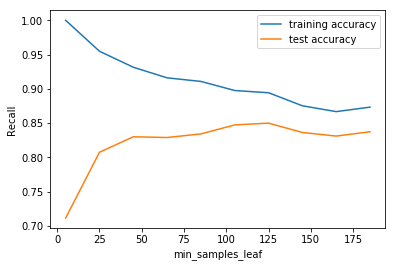

In [226]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [227]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(class_weight='balanced',criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="recall")
tree.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_split': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [228]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.514788,0.071252,0.009203,0.002137,5,{'min_samples_split': 5},0.578534,0.545932,0.564304,0.585302,...,0.561903,0.018897,10,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,1.405799,0.202289,0.008203,0.001940,25,{'min_samples_split': 25},0.662304,0.650919,0.645669,0.687664,...,0.654246,0.020692,9,0.994751,0.995410,0.988197,0.994098,0.995410,0.993573,0.002732
2,1.362998,0.197029,0.007602,0.001201,45,{'min_samples_split': 45},0.706806,0.713911,0.711286,0.740157,...,0.711964,0.016829,8,0.984908,0.984918,0.983607,0.982295,0.992787,0.985703,0.003673
3,1.573400,0.196415,0.008805,0.002638,65,{'min_samples_split': 65},0.740838,0.755906,0.742782,0.761155,...,0.738719,0.024156,7,0.968504,0.979016,0.976393,0.977049,0.982295,0.976652,0.004562
4,1.400796,0.323898,0.008404,0.001851,85,{'min_samples_split': 85},0.753927,0.774278,0.755906,0.776903,...,0.752885,0.026427,6,0.963255,0.963934,0.967213,0.959344,0.965246,0.963798,0.002604


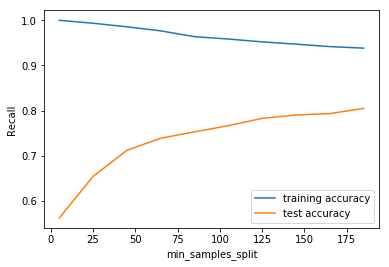

In [229]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid Search to Find Optimal Hyperparameters

In [236]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 250, 50),
    'min_samples_split': range(50, 250, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          scoring="recall", cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed: 12.3min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(5, 15, 2), 'min_samples_leaf': range(50, 250, 50), 'min_samples_split': range(50, 250, 50), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=1)

In [237]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.815397,0.119197,0.007802,0.000980,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.777487,...,0.786468,0.019487,155,0.805118,0.788197,0.863607,0.813115,0.822951,0.818597,0.025222
1,0.722600,0.048384,0.007400,0.000799,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.777487,...,0.786993,0.019185,150,0.805118,0.788197,0.863607,0.813115,0.822951,0.818597,0.025222
2,0.678793,0.031178,0.007409,0.000485,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.780105,...,0.786467,0.015926,156,0.809055,0.788197,0.857049,0.813115,0.819016,0.817286,0.022430
3,0.736001,0.052323,0.007407,0.001353,entropy,5,50,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.787958,...,0.789612,0.015769,149,0.812336,0.788197,0.857049,0.811803,0.823607,0.818598,0.022420
4,0.736197,0.066605,0.008208,0.001935,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.777487,...,0.790142,0.013061,145,0.803150,0.796721,0.849836,0.812459,0.824262,0.817286,0.018731
5,0.815794,0.125407,0.008606,0.001353,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.777487,...,0.790142,0.013061,145,0.803150,0.796721,0.849836,0.812459,0.824262,0.817286,0.018731
6,0.734602,0.071260,0.007399,0.001021,entropy,5,100,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.777487,...,0.790142,0.013061,145,0.803150,0.796721,0.849836,0.812459,0.824262,0.817286,0.018731
7,0.731999,0.075942,0.007607,0.000797,entropy,5,100,200,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.777487,...,0.790142,0.013061,145,0.803150,0.796721,0.849836,0.812459,0.824262,0.817286,0.018731
8,0.666601,0.031865,0.007402,0.000802,entropy,5,150,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.772251,...,0.786470,0.019312,151,0.796588,0.791475,0.859016,0.802623,0.810492,0.812039,0.024329
9,0.672400,0.047158,0.007806,0.002635,entropy,5,150,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.772251,...,0.786470,0.019312,151,0.796588,0.791475,0.859016,0.802623,0.810492,0.812039,0.024329


In [238]:
# printing the optimal accuracy score and hyperparameters
print("best recall", grid_search.best_score_)
print(grid_search.best_estimator_)

best recall 0.848364651456489
DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
            max_depth=11, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


#### Running the model with best prameters obtained from Grid search

In [239]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(class_weight='balanced',
                                  criterion='entropy', 
                                  random_state = 100,
                                  max_depth=11, 
                                  min_samples_leaf=100,
                                  min_samples_split=50)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
            max_depth=11, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

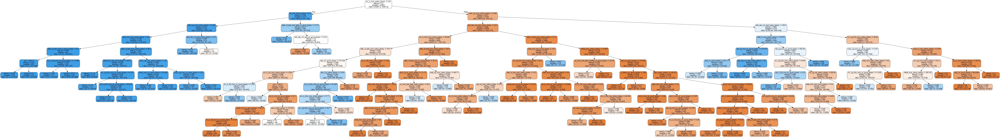

In [241]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=list(telecom_high_value.columns[1:106]),filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [240]:
## checking accuracy score
clf_entropy.score(X_test,y_test)

0.8507346393588602

In [242]:
## making predictions
y_pred = clf_entropy.predict(X_test)


print(metrics.confusion_matrix(y_test, y_pred))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, y_pred))

# precision
print("precision", metrics.precision_score(y_test, y_pred))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, y_pred))

[[7000 1228]
 [ 113  643]]
accuracy 0.8507346393588602
precision 0.3436664885088188
recall 0.8505291005291006


#### Result : The Decision Tree model after tuning provided the recall value of 85.05% on test data.

## Random Forest model

#### Data preparation for Random Forest

In [74]:
# Putting feature variable to X
X = telecom_high_value.drop(['mobile_number','churn'],axis=1)

# Putting response variable to y
y = telecom_high_value['churn']

X.head()

,aon,arpu_av_good_phase,arpu_action_phase,onnet_mou_av_good_phase,onnet_mou_action_phase,offnet_mou_av_good_phase,offnet_mou_action_phase,roam_ic_mou_av_good_phase,roam_ic_mou_action_phase,roam_og_mou_av_good_phase,...,sachet_2g_av_good_phase,sachet_2g_action_phase,monthly_3g_av_good_phase,monthly_3g_action_phase,sachet_3g_av_good_phase,sachet_3g_action_phase,fb_user_good_phase,fb_user_action_phase,vbc_av_good_phase,vbc_action_phase
0,968,206.1005,213.803,0.000,0.00,0.000,0.00,0.000,0.00,0.000,...,0.0,0,1.0,1,0.0,0,1,1.0,50.600,30.40
2,1103,178.3740,210.226,33.390,37.26,181.960,208.36,0.000,0.00,0.000,...,0.0,0,0.0,0,0.0,0,0,0.0,2.085,0.00
7,802,1209.5150,3171.480,56.260,52.29,510.295,325.91,24.860,31.64,18.165,...,0.0,0,0.0,0,0.0,0,0,0.0,19.060,57.74
9,902,183.4765,170.231,32.000,22.43,58.820,78.34,0.000,0.00,0.000,...,0.0,0,0.0,0,0.0,0,1,0.0,0.000,0.00
13,2607,349.2585,593.260,305.075,534.24,266.295,482.46,83.885,72.11,21.620,...,0.0,3,0.0,0,0.0,0,0,1.0,0.000,0.00


In [75]:
from sklearn.model_selection import train_test_split
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

#### Creating Random Forest Model

In [76]:
from sklearn.ensemble import RandomForestClassifier

## creating Random Forest ensamble and fitting training data 
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

In [77]:
# Making predictions
predictions = rfc.predict(X_test)

In [78]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      8228
           1       0.78      0.54      0.64       756

   micro avg       0.95      0.95      0.95      8984
   macro avg       0.87      0.76      0.81      8984
weighted avg       0.94      0.95      0.94      8984



In [79]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[8113  115]
 [ 348  408]]
accuracy 0.9484639358860196
precision 0.780114722753346
recall 0.5396825396825397


### Tuning Hyperparameters

#### Tuning max_depth

In [80]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall")
rf.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators='warn', n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': range(2, 20, 4)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='recall', verbose=0)

In [81]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.139243,0.007284,0.010202,0.001228,2,{'max_depth': 2},0.727749,0.716535,0.679790,0.708661,...,0.708281,0.015870,2,0.738189,0.709508,0.705574,0.706885,0.705574,0.713146,0.012604
1,0.318009,0.007310,0.010442,0.000560,6,{'max_depth': 6},0.714660,0.737533,0.729659,0.774278,...,0.739780,0.019686,1,0.791995,0.807869,0.817049,0.828197,0.819672,0.812956,0.012324
2,0.468782,0.005055,0.012096,0.001416,10,{'max_depth': 10},0.662304,0.695538,0.677165,0.700787,...,0.682590,0.013923,3,0.892388,0.902295,0.904918,0.897705,0.891148,0.897691,0.005373
3,0.554225,0.012828,0.012084,0.000548,14,{'max_depth': 14},0.604712,0.637795,0.611549,0.648294,...,0.625402,0.016114,4,0.939633,0.952787,0.938361,0.925246,0.946885,0.940582,0.009271
4,0.569834,0.022911,0.012517,0.000631,18,{'max_depth': 18},0.609948,0.608924,0.598425,0.619423,...,0.605979,0.009231,5,0.938320,0.934426,0.950164,0.939672,0.933115,0.939139,0.006017


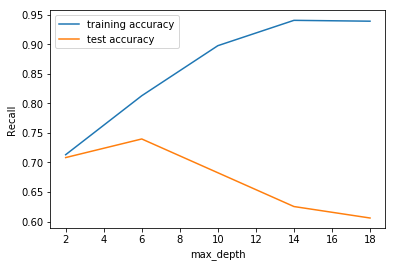

In [82]:
## visualizing results
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning n_estimators

In [83]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall")
rf.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=6, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators='warn', n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': range(100, 1500, 400)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [84]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,5.070893,0.073826,0.071682,0.003210,100,{'n_estimators': 100},0.738220,0.755906,0.742782,0.758530,...,0.748693,0.007667,1,0.807743,0.808525,0.816393,0.820328,0.815738,0.813745,0.004850
1,26.018098,0.297705,0.367507,0.009116,500,{'n_estimators': 500},0.743455,0.753281,0.740157,0.753281,...,0.745541,0.006592,4,0.814961,0.802623,0.819016,0.819672,0.813770,0.814009,0.006128
2,48.954470,0.127785,0.613225,0.052831,900,{'n_estimators': 900},0.735602,0.761155,0.740157,0.758530,...,0.745545,0.011967,3,0.812992,0.807869,0.819672,0.819016,0.812459,0.814402,0.004416
3,60.917005,5.334248,0.564336,0.094006,1300,{'n_estimators': 1300},0.735602,0.763780,0.742782,0.755906,...,0.746594,0.011436,2,0.815617,0.807213,0.819016,0.819672,0.814426,0.815189,0.004453


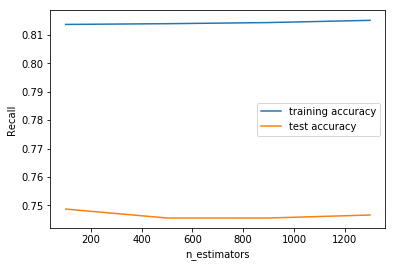

In [85]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning max_features

In [86]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24,30,36,40]}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall")
rf.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=6, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators='warn', n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_features': [4, 8, 14, 20, 24, 30, 36, 40]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [87]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.158593,0.003912,0.010813,0.000202,4,{'max_features': 4},0.743455,0.748031,0.750656,0.727034,...,0.740292,0.009135,8,0.797900,0.776393,0.798689,0.777049,0.793443,0.788695,0.009941
1,0.262689,0.004300,0.010410,0.000387,8,{'max_features': 8},0.730366,0.758530,0.729659,0.742782,...,0.741348,0.010686,7,0.801837,0.807213,0.809180,0.801967,0.809836,0.806007,0.003461
2,0.428186,0.004041,0.010305,0.000461,14,{'max_features': 14},0.756545,0.761155,0.750656,0.740157,...,0.752884,0.007181,6,0.820866,0.820328,0.820984,0.820984,0.841967,0.825026,0.008474
3,0.594944,0.006334,0.010723,0.000413,20,{'max_features': 20},0.751309,0.784777,0.750656,0.766404,...,0.764959,0.012888,2,0.839239,0.845246,0.836066,0.837377,0.837377,0.839061,0.003254
4,0.697547,0.010250,0.010999,0.000323,24,{'max_features': 24},0.764398,0.766404,0.745407,0.766404,...,0.760229,0.007952,4,0.838583,0.836066,0.837377,0.851148,0.855738,0.843782,0.008060


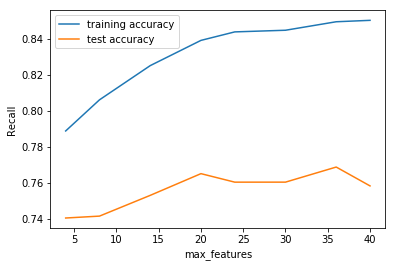

In [88]:
# plotting recall with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_leaf

In [93]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall")
rf.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators='warn', n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_leaf': range(100, 400, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [94]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.399332,0.005251,0.011121,0.000205,100,{'min_samples_leaf': 100},0.785340,0.811024,0.755906,0.784777,...,0.784365,0.017446,1,0.824803,0.829508,0.822951,0.812459,0.832131,0.824370,0.006793
1,0.370440,0.008985,0.010629,0.000449,150,{'min_samples_leaf': 150},0.772251,0.805774,0.766404,0.779528,...,0.778597,0.014282,2,0.813648,0.814426,0.819016,0.826230,0.817705,0.818205,0.004480
2,0.348451,0.004636,0.010537,0.000626,200,{'min_samples_leaf': 200},0.787958,0.800525,0.763780,0.766404,...,0.775441,0.016059,5,0.806430,0.805902,0.803934,0.793443,0.796066,0.801155,0.005357
3,0.346161,0.023478,0.010500,0.000389,250,{'min_samples_leaf': 250},0.774869,0.795276,0.771654,0.784777,...,0.778596,0.010267,3,0.796588,0.794098,0.809180,0.802623,0.800000,0.800498,0.005223
4,0.331597,0.020431,0.011285,0.001293,300,{'min_samples_leaf': 300},0.772251,0.795276,0.769029,0.779528,...,0.777547,0.009524,4,0.805118,0.798033,0.792787,0.790820,0.787541,0.794860,0.006156


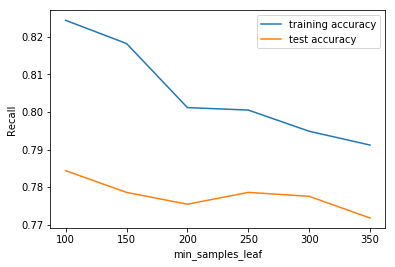

In [95]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [96]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall")
rf.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators='warn', n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_split': range(200, 500, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [97]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.539655,0.024002,0.012051,0.000441,200,{'min_samples_split': 200},0.777487,0.782152,0.761155,0.771654,...,0.770196,0.009122,6,0.851050,0.849180,0.851803,0.856393,0.858361,0.853358,0.003448
1,0.507268,0.010980,0.011432,0.000332,250,{'min_samples_split': 250},0.767016,0.771654,0.766404,0.782152,...,0.773350,0.006433,5,0.834646,0.842623,0.842623,0.849180,0.841967,0.842208,0.004609
2,0.520084,0.014624,0.011678,0.001078,300,{'min_samples_split': 300},0.780105,0.784777,0.755906,0.792651,...,0.777543,0.012377,4,0.835958,0.836721,0.843934,0.832131,0.840000,0.837749,0.003979
3,0.481811,0.026672,0.011119,0.000168,350,{'min_samples_split': 350},0.777487,0.787402,0.776903,0.776903,...,0.779644,0.003997,3,0.843832,0.840656,0.830164,0.825574,0.840000,0.836045,0.006954
4,0.480103,0.015636,0.011118,0.000568,400,{'min_samples_split': 400},0.782723,0.813648,0.748031,0.792651,...,0.782791,0.021411,1,0.830709,0.828852,0.817705,0.822295,0.832131,0.826338,0.005475


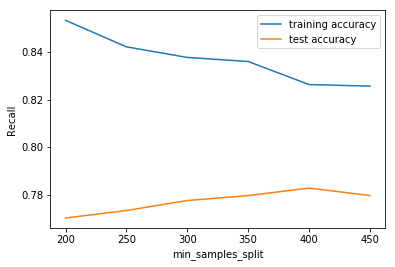

In [98]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

#### Grid Search to Find Optimal Hyperparameters

In [100]:
# specify number of folds for k-fold CV
n_folds = 3

param_grid = {
    'max_depth': [6,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [400,600,800], 
    'max_features': [10,20,30]
}
# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                    cv=n_folds, n_jobs = -1,verbose = 1,
                   scoring="recall")
rf.fit(X_train, y_train)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 26.3min
[Parallel(n_jobs=-1)]: Done 324 out of 324 | elapsed: 49.1min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators='warn', n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [6, 8, 10], 'min_samples_leaf': range(100, 400, 200), 'min_samples_split': range(200, 500, 200), 'n_estimators': [400, 600, 800], 'max_features': [10, 20, 30]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=1)

In [101]:
# printing the optimal recall score and hyperparameters
print('We can get recall of',rf.best_score_,'using',rf.best_params_)

We can get recall of 0.798530854101731 using {'max_depth': 10, 'max_features': 30, 'min_samples_leaf': 100, 'min_samples_split': 400, 'n_estimators': 600}


In [104]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=100, 
                             min_samples_split=400,
                             max_features=30,
                             n_estimators=600,class_weight='balanced')

In [105]:
# fit
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=10, max_features=30,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=100,
            min_samples_split=400, min_weight_fraction_leaf=0.0,
            n_estimators=600, n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

In [106]:
# predict
predictions = rfc.predict(X_test)

In [107]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.99      0.90      0.94      8228
           1       0.45      0.85      0.59       756

   micro avg       0.90      0.90      0.90      8984
   macro avg       0.72      0.88      0.77      8984
weighted avg       0.94      0.90      0.91      8984



In [108]:
print(metrics.confusion_matrix(y_test, predictions))

# accuracy
print("accuracy", metrics.accuracy_score(y_test, predictions))

# precision
print("precision", metrics.precision_score(y_test, predictions))

# recall/sensitivity
print("recall", metrics.recall_score(y_test, predictions))

[[7435  793]
 [ 111  645]]
accuracy 0.8993766696349065
precision 0.4485396383866481
recall 0.8531746031746031


#### Result : The Random Forest model after tuning provided the recall value of 85.32% on test data.

# Summary

Below tables provides the results for different models:

| Model Name | Consider Class Imbalance | Explains through variables | Recall Score | Precision Score |
| --- | --- | --- | --- | --- |
|Basic Logistic Regression Model using GLM | N | Y | Insignificant | Insignificant |
| Logistic Regression Model with RFE | Y | Y | 0.81 | 0.39 |
| Logistic Regression Model with L1/L2 Regularization | Y | N | 0.53 | 0.44 |
| Logistic Regression Model with PCA | Y | N | 0.69 | 0.35 |
| Decision Tree Model | Y | Y | 0.85 | 0.34 |
| Random Forest Model | Y | N | 0.85 | 0.44 |

# Conclusion

Based on the above results, we recommend to use the model for <b>Decision Tree</b> both for Prediction and explaination. This model is choosen for following reasons :

- The optimized model provides a good recall score.
- It is easier to understand and explain to the business users.
- Its complexity is less in comarison to Random forest which provides more or less same score.
- It is free from Multicollinearlity issues and even doesn't require any regularization.
- Its optimized tree depth comes more or less same as Random Forest.

# Important churn indicators

- loc_ic_mou_action_phase
- fb_user_action_phase
- roam_og_mou_action_phase
- total_og_mou_action_phase
- date_of_last_rech_data_av_good_phase
- last_day_rch_amt_action_phase
- loc_og_t2m_mou_action_phase
- total_ic_mou_action_phase
- date_of_last_rech_action_phase
- loc_ic_t2m_mou_action_phase
- last_day_rch_amt_av_good_phase
- total_rech_num_action_phase


# Actionable recommendations

- During action phase if user is in roaming state and outgoing minutes of usage is more that means user is using our service effectively. So we should offer discounts for roaming.
- We should include attractive packages to user enabling them to avail services of Facebook and similar social networking sites with a better value proposition compared  to other operators.
- If minutes of usage for outgoing call is more then we should offer discounts on outgoing call rate
- If outgoing calls are made from our operator T to other operator M; we can offer discounts on call rates during specific hours or 24 hours for calls within operator T. Also, we can offer discount for groups to entice user to invite other users on our operator T. 
- If total recharge number is less in action phase, we should check last day recharge amount and accordingly offer value discounts. We can offer full talk-time recharge or life time validity recharge, or recharge with lower call rates during specific hours. 
- For our regular users which should run loyalty schemes, to avoid their movement in action phase. 
